In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import random as rnd
import plotly.express as px 

from sklearn import datasets
from sklearn import tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.svm import SVC

import datetime

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

sns.set(rc={"figure.dpi":100, 'savefig.dpi':300})
sns.set_context('notebook')
sns.set_style("ticks")
from IPython.display import set_matplotlib_formats
%config InlineBackend.figure_format = 'retina'

In [3]:
df = pd.read_csv('df_imputed_AQI_FINAL.csv')

In [4]:
df

,Unnamed: 0,Datetime,Station,PM2.5,PM2.5_24_avg,NO,NO2,NOx,NOx_SubIndex,SO2,...,AQI_Bucket,Day,Month,Year,Week,Hour,AQI_calculated,PM2.5_24_avg_Sub_Index,CO_8_avg_Sub_Index,NO2_Sub_Index
0,23,2020-03-04 23:00:00,NISE,28.89,73.831667,7.25,21.37,28.63,35.7875,7.690000,...,Moderate,4,3,2020,10,23,145.0,144.804655,86.388889,26.712500
1,24,2020-03-05 00:00:00,NISE,21.17,71.019167,7.41,20.99,28.41,35.5125,7.440000,...,Moderate,5,3,2020,10,0,135.0,135.203362,85.163889,26.237500
2,25,2020-03-05 01:00:00,NISE,21.47,68.479583,7.48,20.49,27.97,34.9625,6.823333,...,Moderate,5,3,2020,10,1,127.0,126.533750,84.823611,25.612500
3,26,2020-03-05 02:00:00,NISE,31.70,66.369167,7.28,14.93,22.22,27.7750,6.633333,...,Moderate,5,3,2020,10,2,119.0,119.329224,84.347222,18.662500
4,27,2020-03-05 03:00:00,NISE,25.81,63.180417,7.85,17.92,25.77,32.2125,6.583333,...,Moderate,5,3,2020,10,3,108.0,108.443491,84.279167,22.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147411,147526,2023-03-26 03:00:00,Vikas Sadan,83.22,49.372083,23.90,49.59,70.03,87.5375,41.300000,...,Satisfactory,26,3,2023,12,3,88.0,82.042486,84.211111,61.792564
147412,147527,2023-03-26 04:00:00,Vikas Sadan,71.96,50.378750,24.25,53.15,71.91,89.8875,40.560000,...,Satisfactory,26,3,2023,12,4,90.0,83.743405,73.390278,66.265385
147413,147528,2023-03-26 05:00:00,Vikas Sadan,75.47,51.747083,24.55,54.38,64.34,80.4250,40.820000,...,Satisfactory,26,3,2023,12,5,86.0,86.055417,47.125000,67.810769
147414,147529,2023-03-26 06:00:00,Vikas Sadan,69.07,52.885000,23.09,54.48,72.73,90.9125,39.290000,...,Satisfactory,26,3,2023,12,6,91.0,87.978103,37.875000,67.936410


In [5]:
df.set_index(df['Datetime'], inplace = True)
df

,Unnamed: 0,Datetime,Station,PM2.5,PM2.5_24_avg,NO,NO2,NOx,NOx_SubIndex,SO2,...,AQI_Bucket,Day,Month,Year,Week,Hour,AQI_calculated,PM2.5_24_avg_Sub_Index,CO_8_avg_Sub_Index,NO2_Sub_Index
Datetime,,,,,,,,,,,,,,,,,,,,,
2020-03-04 23:00:00,23,2020-03-04 23:00:00,NISE,28.89,73.831667,7.25,21.37,28.63,35.7875,7.690000,...,Moderate,4,3,2020,10,23,145.0,144.804655,86.388889,26.712500
2020-03-05 00:00:00,24,2020-03-05 00:00:00,NISE,21.17,71.019167,7.41,20.99,28.41,35.5125,7.440000,...,Moderate,5,3,2020,10,0,135.0,135.203362,85.163889,26.237500
2020-03-05 01:00:00,25,2020-03-05 01:00:00,NISE,21.47,68.479583,7.48,20.49,27.97,34.9625,6.823333,...,Moderate,5,3,2020,10,1,127.0,126.533750,84.823611,25.612500
2020-03-05 02:00:00,26,2020-03-05 02:00:00,NISE,31.70,66.369167,7.28,14.93,22.22,27.7750,6.633333,...,Moderate,5,3,2020,10,2,119.0,119.329224,84.347222,18.662500
2020-03-05 03:00:00,27,2020-03-05 03:00:00,NISE,25.81,63.180417,7.85,17.92,25.77,32.2125,6.583333,...,Moderate,5,3,2020,10,3,108.0,108.443491,84.279167,22.400000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-26 03:00:00,147526,2023-03-26 03:00:00,Vikas Sadan,83.22,49.372083,23.90,49.59,70.03,87.5375,41.300000,...,Satisfactory,26,3,2023,12,3,88.0,82.042486,84.211111,61.792564
2023-03-26 04:00:00,147527,2023-03-26 04:00:00,Vikas Sadan,71.96,50.378750,24.25,53.15,71.91,89.8875,40.560000,...,Satisfactory,26,3,2023,12,4,90.0,83.743405,73.390278,66.265385
2023-03-26 05:00:00,147528,2023-03-26 05:00:00,Vikas Sadan,75.47,51.747083,24.55,54.38,64.34,80.4250,40.820000,...,Satisfactory,26,3,2023,12,5,86.0,86.055417,47.125000,67.810769


In [10]:
df[[
    'Station', 'PM2.5', 'PM2.5_24_avg', 'PM2.5_24_avg_Sub_Index', 'NO', 'NO2', 'NO2_Sub_Index' ,
    'NOx', 'NOx_SubIndex', 'SO2', 'SO2_SubIndex', 'CO', 'CO_8_avg',
    'CO_8_avg_Sub_Index', 'AQI', 'AQI_calculated'
]]

,Station,PM2.5,PM2.5_24_avg,PM2.5_24_avg_Sub_Index,NO,NO2,NO2_Sub_Index,NOx,NOx_SubIndex,SO2,SO2_SubIndex,CO,CO_8_avg,CO_8_avg_Sub_Index,AQI,AQI_calculated
Datetime,,,,,,,,,,,,,,,,
2020-03-04 23:00:00,NISE,28.89,73.831667,144.804655,7.25,21.37,26.712500,28.63,35.7875,7.690000,9.612500,1.76,1.75000,86.388889,NaN,145.0
2020-03-05 00:00:00,NISE,21.17,71.019167,135.203362,7.41,20.99,26.237500,28.41,35.5125,7.440000,9.300000,1.71,1.72750,85.163889,NaN,135.0
2020-03-05 01:00:00,NISE,21.47,68.479583,126.533750,7.48,20.49,25.612500,27.97,34.9625,6.823333,8.529167,1.74,1.72125,84.823611,NaN,127.0
2020-03-05 02:00:00,NISE,31.70,66.369167,119.329224,7.28,14.93,18.662500,22.22,27.7750,6.633333,8.291667,1.60,1.71250,84.347222,NaN,119.0
2020-03-05 03:00:00,NISE,25.81,63.180417,108.443491,7.85,17.92,22.400000,25.77,32.2125,6.583333,8.229167,1.56,1.71125,84.279167,NaN,108.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-03-26 03:00:00,Vikas Sadan,83.22,49.372083,82.042486,23.90,49.59,61.792564,70.03,87.5375,41.300000,51.376923,0.87,1.71000,84.211111,NaN,88.0
2023-03-26 04:00:00,Vikas Sadan,71.96,50.378750,83.743405,24.25,53.15,66.265385,71.91,89.8875,40.560000,50.447179,0.66,1.51125,73.390278,NaN,90.0
2023-03-26 05:00:00,Vikas Sadan,75.47,51.747083,86.055417,24.55,54.38,67.810769,64.34,80.4250,40.820000,50.773846,0.28,0.94250,47.125000,NaN,86.0


In [5]:
df.columns

Index(['Unnamed: 0', 'Datetime', 'Station', 'PM2.5', 'PM2.5_24_avg', 'NO',
       'NO2', 'NOx', 'NOx_SubIndex', 'SO2', 'SO2_SubIndex', 'CO', 'CO_8_avg',
       'AQI', 'AQI_Bucket', 'Day', 'Month', 'Year', 'Week', 'Hour',
       'AQI_calculated', 'PM2.5_24_avg_Sub_Index', 'CO_8_avg_Sub_Index',
       'NO2_Sub_Index'],
      dtype='object')

In [6]:
df['Station'].unique()

array(['NISE', 'No Station', 'Sector 51', 'Teri Gram', 'Vikas Sadan'],
      dtype=object)

In [6]:
df_nise = df[df['Station'] == 'NISE']
df_no_station = df[df['Station'] == 'No Station']
df_sector_51 = df[df['Station'] == 'Sector 51']
df_teri_gram = df[df['Station'] == 'Teri Gram']
df_vikas_sadan = df[df['Station'] == 'Vikas Sadan']

In [7]:
df_nise.shape
df_no_station.shape
df_sector_51.shape
df_teri_gram.shape
df_vikas_sadan.shape

(26793, 24)

(40235, 24)

(26802, 24)

(26793, 24)

(26793, 24)

In [8]:
df_nise.index = pd.to_datetime(df_nise.index)
df_no_station.index = pd.to_datetime(df_no_station.index)
df_sector_51.index = pd.to_datetime(df_sector_51.index)
df_teri_gram.index = pd.to_datetime(df_teri_gram.index)
df_vikas_sadan.index = pd.to_datetime(df_vikas_sadan.index)

In [9]:
df_nise = df_nise['AQI_calculated']
df_no_station = df_no_station['AQI_calculated']
df_sector_51 = df_sector_51['AQI_calculated']
df_teri_gram = df_teri_gram['AQI_calculated']
df_vikas_sadan = df_vikas_sadan['AQI_calculated']

In [10]:
df_nise = pd.DataFrame(df_nise)
df_no_station = pd.DataFrame(df_no_station)
df_sector_51 = pd.DataFrame(df_sector_51)
df_teri_gram = pd.DataFrame(df_teri_gram)
df_vikas_sadan = pd.DataFrame(df_vikas_sadan)

In [56]:
sector_51_pm25 = df[df['Station'] == 'Sector 51']['PM2.5']
sector_51_pm25 = pd.DataFrame(sector_51_pm25)
sector_51_pm25

,PM2.5
Datetime,
2020-03-04 23:00:00,61.64
2020-03-05 00:00:00,61.64
2020-03-05 01:00:00,61.64
2020-03-05 02:00:00,61.64
2020-03-05 03:00:00,61.64
...,...
2023-03-26 12:00:00,79.90
2023-03-26 13:00:00,86.35
2023-03-26 14:00:00,85.30


In [71]:
sector_51_pm25.index = pd.to_datetime(sector_51_pm25.index)
sector_51_pm25

,PM2.5,First_diff
Datetime,,
2020-03-04 23:00:00,61.64,NaN
2020-03-05 00:00:00,61.64,0.00
2020-03-05 01:00:00,61.64,0.00
2020-03-05 02:00:00,61.64,0.00
2020-03-05 03:00:00,61.64,0.00
...,...,...
2023-03-26 12:00:00,79.90,7.85
2023-03-26 13:00:00,86.35,6.45
2023-03-26 14:00:00,85.30,-1.05


<Figure size 2000x800 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='PM2.5'>

Text(0.5, 1.0, 'PM2.5 2016 - 2023')

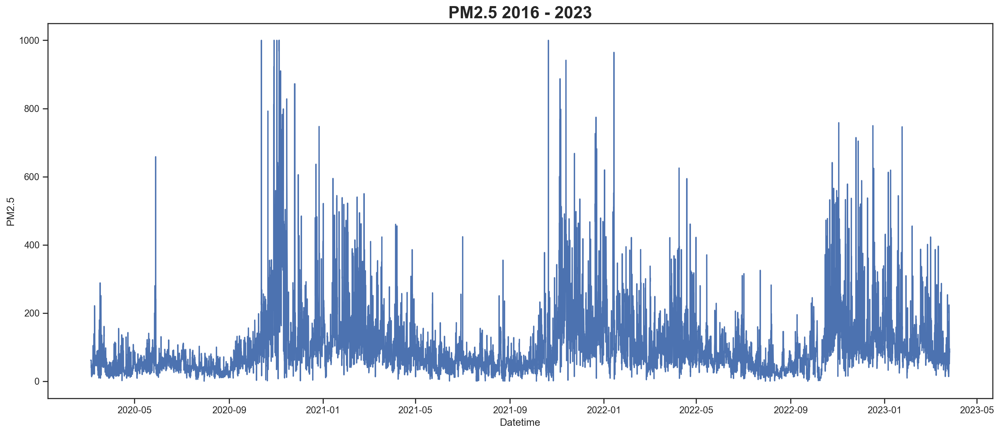

In [74]:
plt.figure(figsize=(20,8))
sns.lineplot(data = sector_51_pm25['PM2.5'], errorbar=None)
plt.title('PM2.5 2016 - 2023', fontdict= {"fontsize": 20, "fontweight": "bold"})

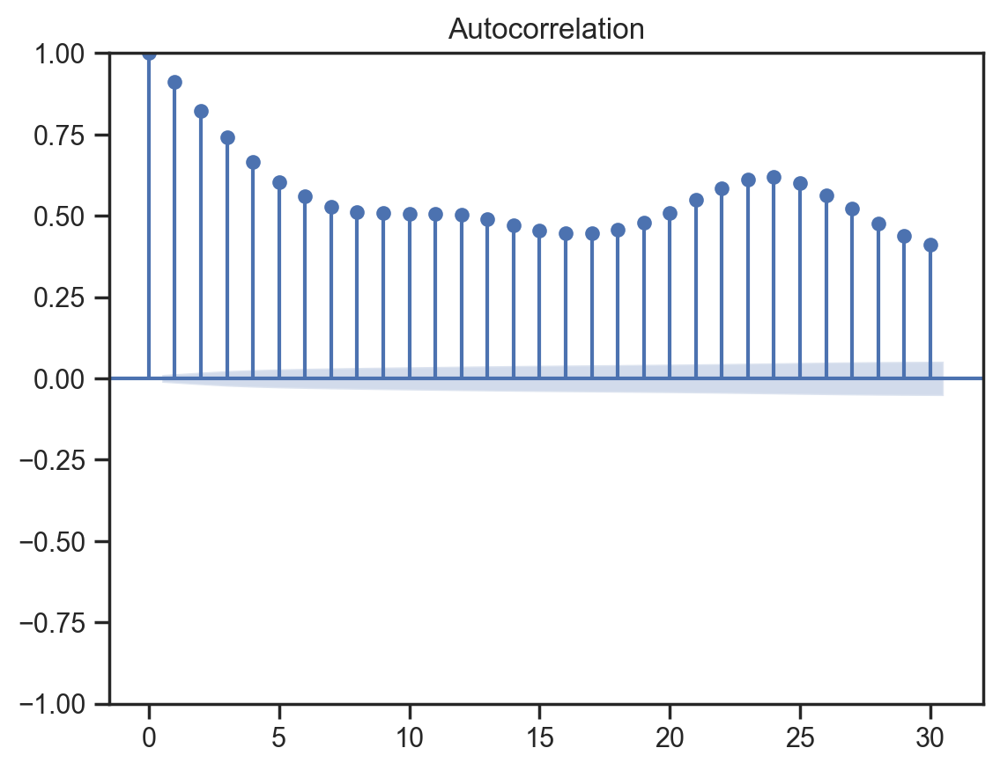

In [62]:
acf_plot = plot_acf(sector_51_pm25['PM2.5'], lags=30)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


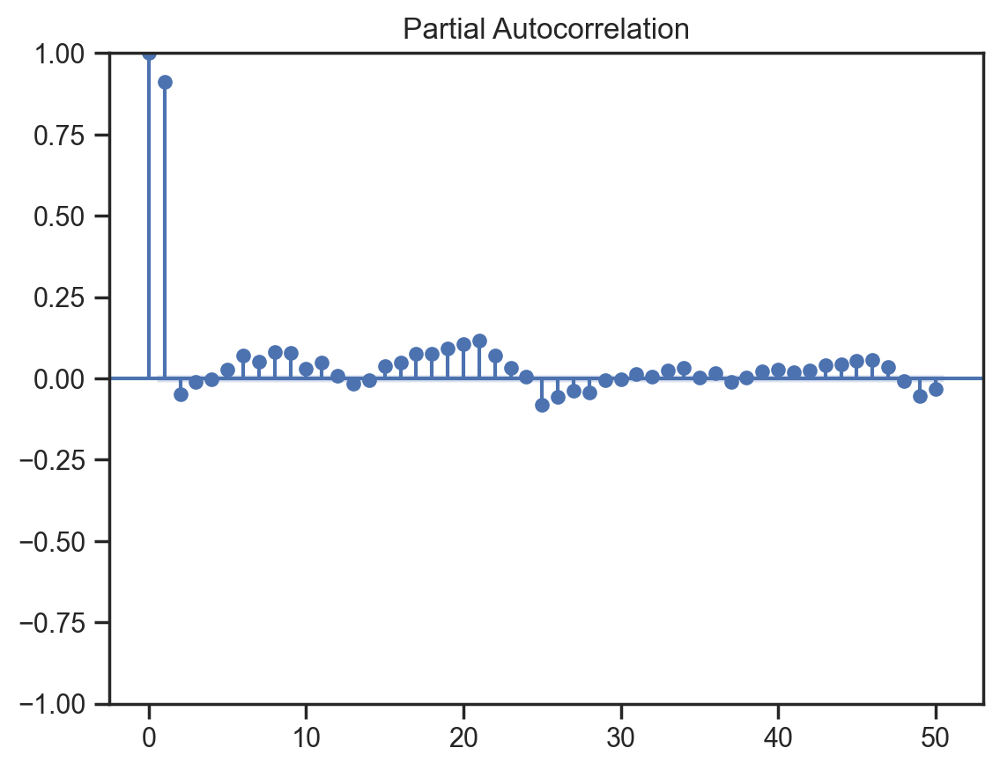

In [60]:
pacf_plot = plot_pacf(sector_51_pm25['PM2.5'], lags=50)

In [69]:
pd.to_datetime(sector_51_pm25.index)

DatetimeIndex(['2020-03-04 23:00:00', '2020-03-05 00:00:00',
               '2020-03-05 01:00:00', '2020-03-05 02:00:00',
               '2020-03-05 03:00:00', '2020-03-05 04:00:00',
               '2020-03-05 05:00:00', '2020-03-05 06:00:00',
               '2020-03-05 07:00:00', '2020-03-05 08:00:00',
               ...
               '2023-03-26 07:00:00', '2023-03-26 08:00:00',
               '2023-03-26 09:00:00', '2023-03-26 10:00:00',
               '2023-03-26 11:00:00', '2023-03-26 12:00:00',
               '2023-03-26 13:00:00', '2023-03-26 14:00:00',
               '2023-03-26 15:00:00', '2023-03-26 16:00:00'],
              dtype='datetime64[ns]', name='Datetime', length=26802, freq=None)

In [ ]:
# ARMA(1,1)
sector_51_pm25['First_diff'] = sector_51_pm25.diff()[1:]

In [70]:
sector_51_pm25

,PM2.5,First_diff
Datetime,,
2020-03-04 23:00:00,61.64,NaN
2020-03-05 00:00:00,61.64,0.00
2020-03-05 01:00:00,61.64,0.00
2020-03-05 02:00:00,61.64,0.00
2020-03-05 03:00:00,61.64,0.00
...,...,...
2023-03-26 12:00:00,79.90,7.85
2023-03-26 13:00:00,86.35,6.45
2023-03-26 14:00:00,85.30,-1.05


<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='First_diff'>

Text(0.5, 1.0, 'PM2.5 2016 - 2023')

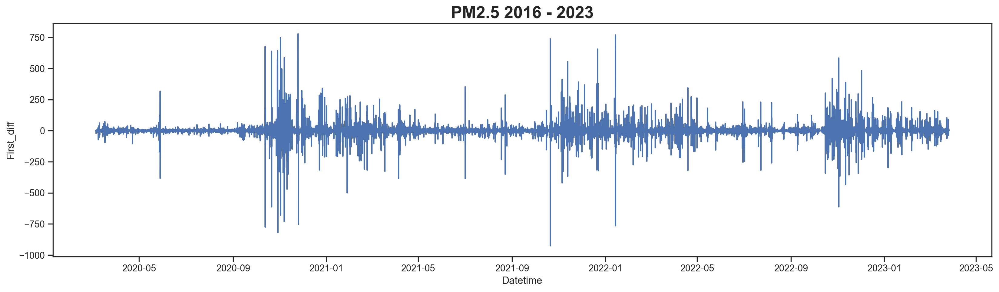

In [72]:
plt.figure(figsize=(20,5))
sns.lineplot(data = sector_51_pm25['First_diff'], errorbar=None)
plt.title('PM2.5 2016 - 2023', fontdict= {"fontsize": 20, "fontweight": "bold"})

In [91]:
# Get training and testing sets

# We only take 2 days in testing since we are doing MA(2)
train_end = datetime(2022,12,26)
test_end = datetime(2023,3,25)

train_data = sector_51_pm25[:train_end]['First_diff'][1:]
test_data = sector_51_pm25[train_end + timedelta(hours=1):test_end]['First_diff']

In [92]:
train_data
test_data

Datetime
2020-03-05 00:00:00     0.00
2020-03-05 01:00:00     0.00
2020-03-05 02:00:00     0.00
2020-03-05 03:00:00     0.00
2020-03-05 04:00:00     0.00
                       ...  
2022-12-25 20:00:00    14.53
2022-12-25 21:00:00     3.70
2022-12-25 22:00:00   -11.20
2022-12-25 23:00:00    -2.05
2022-12-26 00:00:00     2.90
Name: First_diff, Length: 24625, dtype: float64

Datetime
2022-12-26 01:00:00    -8.12
2022-12-26 02:00:00    -9.26
2022-12-26 03:00:00    -4.15
2022-12-26 04:00:00    -8.07
2022-12-26 05:00:00   -14.20
                       ...  
2023-03-24 20:00:00   -10.70
2023-03-24 21:00:00    -4.20
2023-03-24 22:00:00    -3.53
2023-03-24 23:00:00    -5.32
2023-03-25 00:00:00    -4.25
Name: First_diff, Length: 2136, dtype: float64

In [94]:
model = ARIMA(train_data, order=(1,0,1)) # AR order 0, I order 0, MA is 2
model = model.fit()

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning: Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.
  warn('Non-stationary starting autoregressiv

In [95]:
print(model.summary())

                               SARIMAX Results                                
Dep. Variable:             First_diff   No. Observations:                24625
Model:                 ARIMA(1, 0, 1)   Log Likelihood             -125566.507
Date:                Fri, 17 Nov 2023   AIC                         251141.014
Time:                        21:36:46   BIC                         251173.461
Sample:                    03-05-2020   HQIC                        251151.524
                         - 12-26-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0042      0.029      0.144      0.885      -0.053       0.061
ar.L1          0.8339      0.002    542.295      0.000       0.831       0.837
ma.L1         -0.9864      0.001  -1448.948      0.0

In [96]:
#get prediction start and end dates
pred_start_date = test_data.index[0]
pred_end_date = test_data.index[-1]
#get the predictions and residuals
predictions = model.predict(start=pred_start_date, end=pred_end_date)
residuals = test_data - predictions

In [97]:
residuals

Datetime
2022-12-26 01:00:00   -10.236590
2022-12-26 02:00:00   -11.025675
2022-12-26 03:00:00    -5.623055
2022-12-26 04:00:00    -9.299047
2022-12-26 05:00:00   -15.225573
                         ...    
2023-03-24 20:00:00   -10.704210
2023-03-24 21:00:00    -4.204210
2023-03-24 22:00:00    -3.534210
2023-03-24 23:00:00    -5.324210
2023-03-25 00:00:00    -4.254210
Length: 2136, dtype: float64

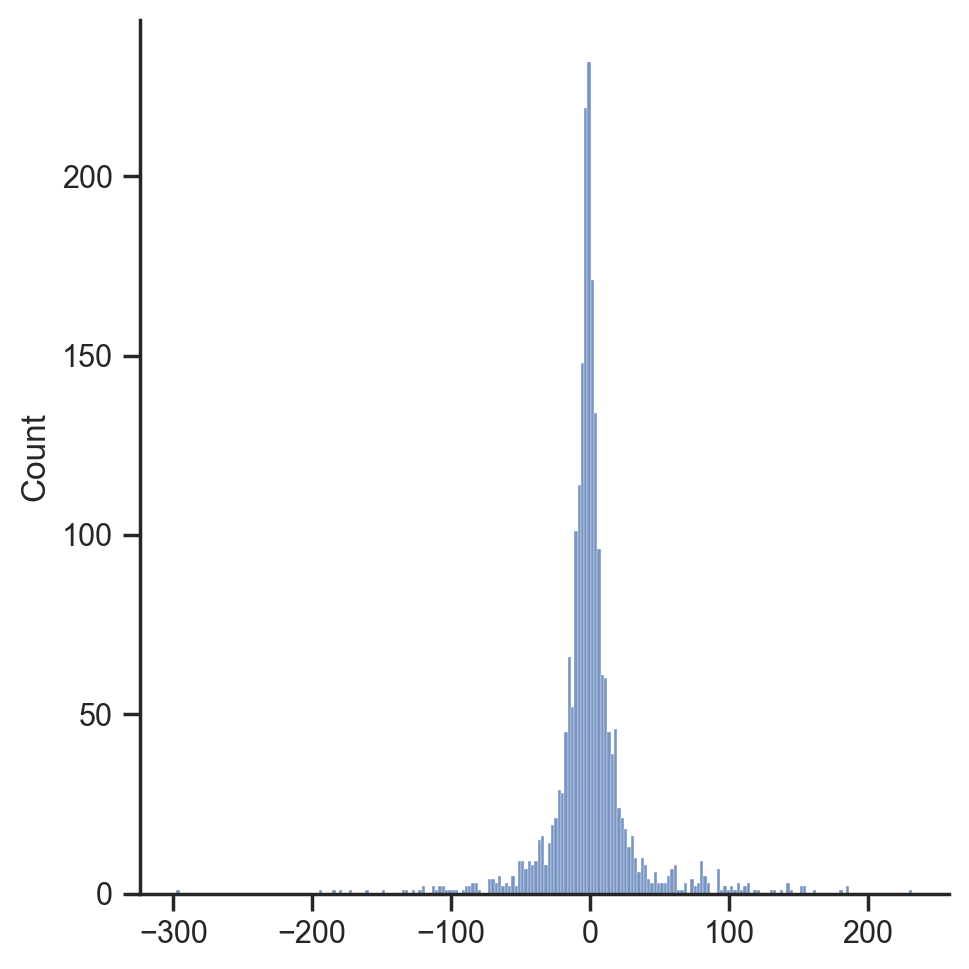

In [103]:
sns.displot(residuals)

In [102]:
(predictions, test_data)

(2022-12-26 01:00:00    2.116590
 2022-12-26 02:00:00    1.765675
 2022-12-26 03:00:00    1.473055
 2022-12-26 04:00:00    1.229047
 2022-12-26 05:00:00    1.025573
                          ...   
 2023-03-24 20:00:00    0.004210
 2023-03-24 21:00:00    0.004210
 2023-03-24 22:00:00    0.004210
 2023-03-24 23:00:00    0.004210
 2023-03-25 00:00:00    0.004210
 Freq: H, Name: predicted_mean, Length: 2136, dtype: float64,
 Datetime
 2022-12-26 01:00:00    -8.12
 2022-12-26 02:00:00    -9.26
 2022-12-26 03:00:00    -4.15
 2022-12-26 04:00:00    -8.07
 2022-12-26 05:00:00   -14.20
                        ...  
 2023-03-24 20:00:00   -10.70
 2023-03-24 21:00:00    -4.20
 2023-03-24 22:00:00    -3.53
 2023-03-24 23:00:00    -5.32
 2023-03-25 00:00:00    -4.25
 Name: First_diff, Length: 2136, dtype: float64)

<Figure size 1000x400 with 0 Axes>

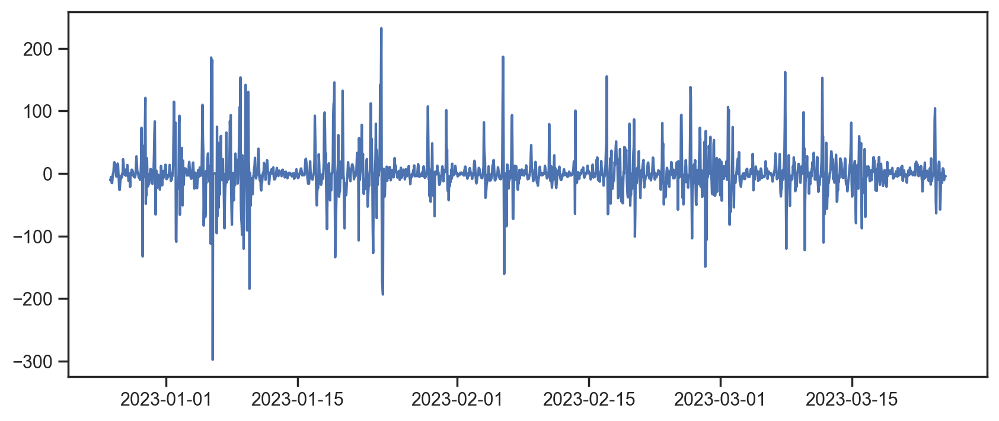

In [104]:
plt.figure(figsize=(10,4))

plt.plot(residuals)

<Figure size 1000x400 with 0 Axes>

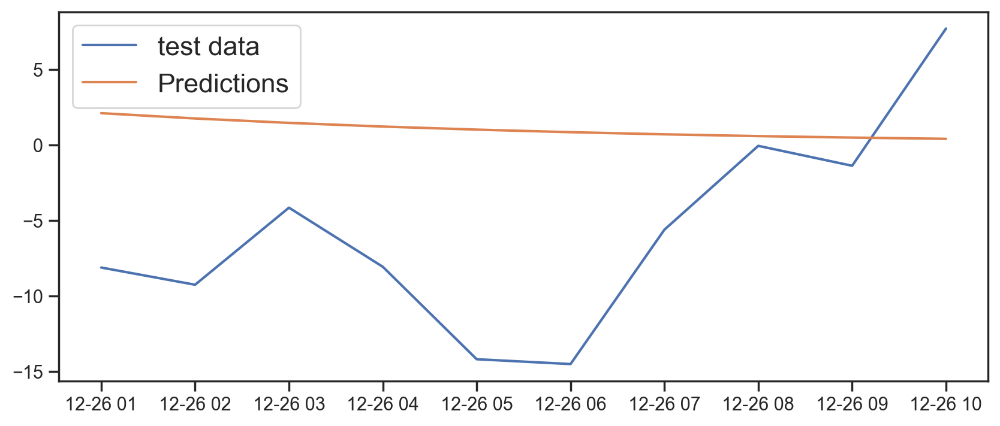

In [105]:
plt.figure(figsize=(10,4))

plt.plot(test_data[:10])
plt.plot(predictions[:10])

plt.legend(('test data', 'Predictions'), fontsize=16)

In [11]:
df_nise.rename(columns= {'AQI_calculated': "AQI"}, inplace=True)
df_no_station.rename(columns= {'AQI_calculated': "AQI"}, inplace=True)
df_sector_51.rename(columns= {'AQI_calculated': "AQI"}, inplace=True)
df_teri_gram.rename(columns= {'AQI_calculated': "AQI"}, inplace=True)
df_vikas_sadan.rename(columns= {'AQI_calculated': "AQI"}, inplace=True)

In [12]:
df_nise

,AQI
Datetime,
2020-03-04 23:00:00,145.0
2020-03-05 00:00:00,135.0
2020-03-05 01:00:00,127.0
2020-03-05 02:00:00,119.0
2020-03-05 03:00:00,108.0
...,...
2023-03-26 03:00:00,200.0
2023-03-26 04:00:00,178.0
2023-03-26 05:00:00,127.0


In [13]:
# df.Station.unique()
Stations = ["NISE",'No Station', 'Sector 51', 'Teri Gram', 'Vikas Sadan']
dataframes = [df_nise, df_no_station, df_sector_51, df_teri_gram, df_vikas_sadan]

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='AQI'>

Text(0.5, 1.0, 'NISE AQI 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='AQI'>

Text(0.5, 1.0, 'No Station AQI 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='AQI'>

Text(0.5, 1.0, 'Sector 51 AQI 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='AQI'>

Text(0.5, 1.0, 'Teri Gram AQI 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='AQI'>

Text(0.5, 1.0, 'Vikas Sadan AQI 2016 - 2023')

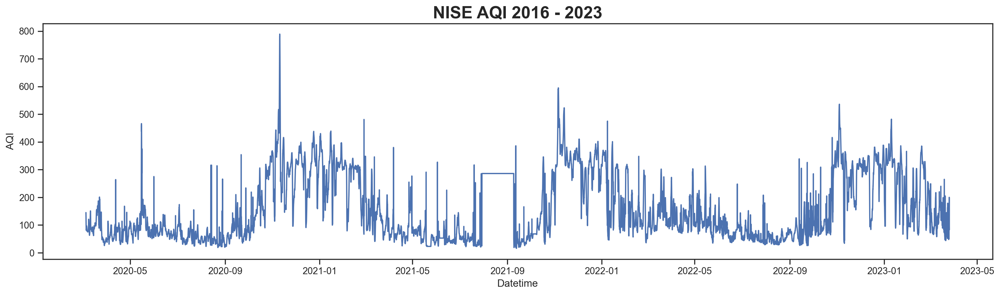

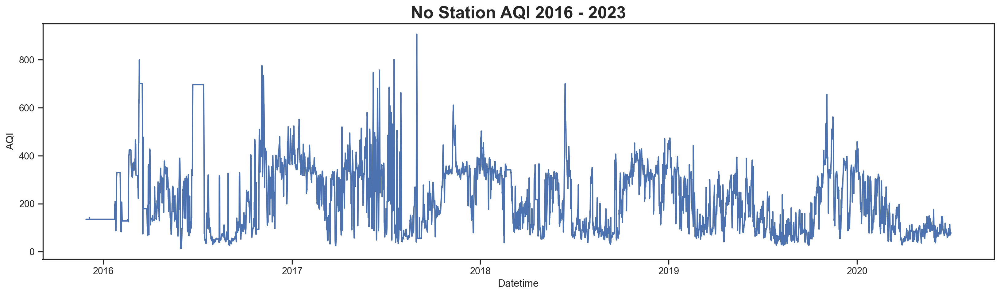

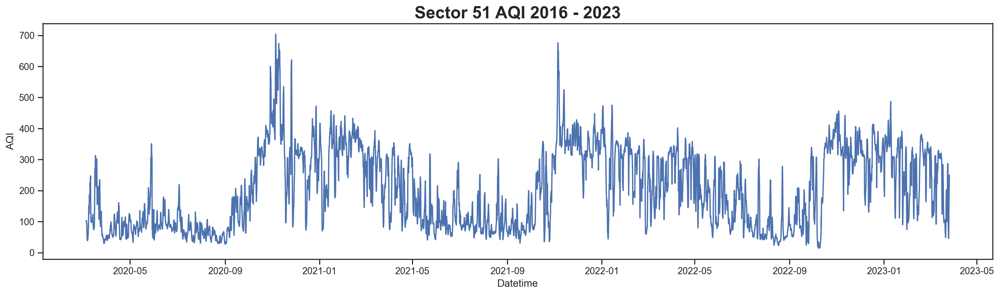

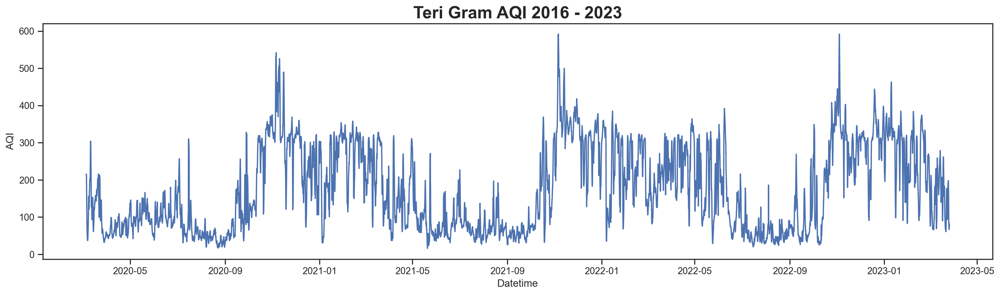

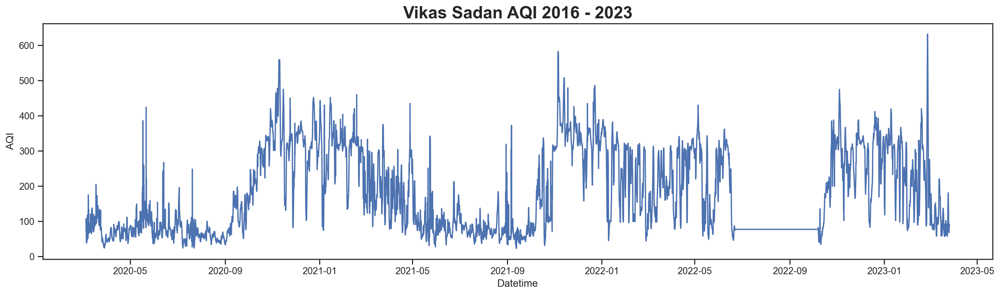

In [23]:
for i in range(len(Stations)):
    plt.figure(figsize=(20,5))
    sns.lineplot(data = dataframes[i]['AQI'], errorbar=None)
    plt.title(Stations[i]+' AQI 2016 - 2023', fontdict= {"fontsize": 20, "fontweight": "bold"})
    

In [14]:
for i in range(len(Stations)):
    dataframes[i]['Lag_1'] = dataframes[i]['AQI'].shift(1)

In [15]:
for i in range(len(Stations)):
    first_diffs = dataframes[i].AQI.values[1:] - dataframes[i].AQI.values[:-1] 
    first_diffs = np.concatenate([first_diffs, [0]])
    dataframes[i]['First_diff'] = first_diffs

In [16]:
df_nise.head()

,AQI,Lag_1,First_diff
Datetime,,,
2020-03-04 23:00:00,145.0,NaN,-10.0
2020-03-05 00:00:00,135.0,145.0,-8.0
2020-03-05 01:00:00,127.0,135.0,-8.0
2020-03-05 02:00:00,119.0,127.0,-11.0
2020-03-05 03:00:00,108.0,119.0,-9.0


<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='First_diff'>

Text(0.5, 1.0, 'NISE First diff 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='First_diff'>

Text(0.5, 1.0, 'No Station First diff 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='First_diff'>

Text(0.5, 1.0, 'Sector 51 First diff 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='First_diff'>

Text(0.5, 1.0, 'Teri Gram First diff 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='First_diff'>

Text(0.5, 1.0, 'Vikas Sadan First diff 2016 - 2023')

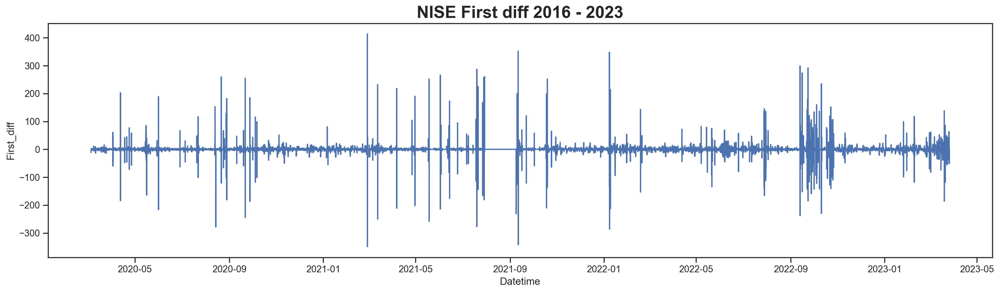

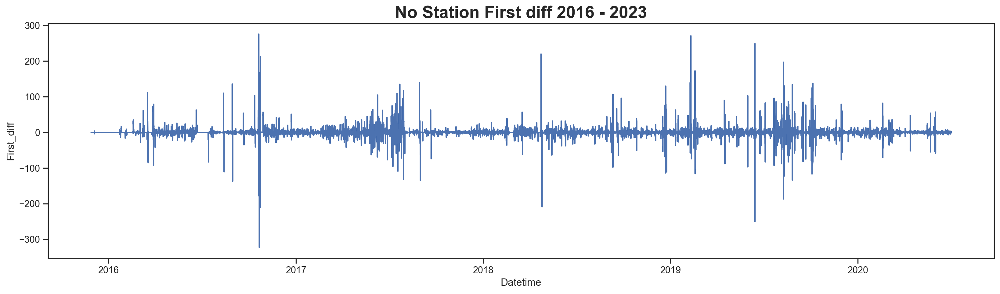

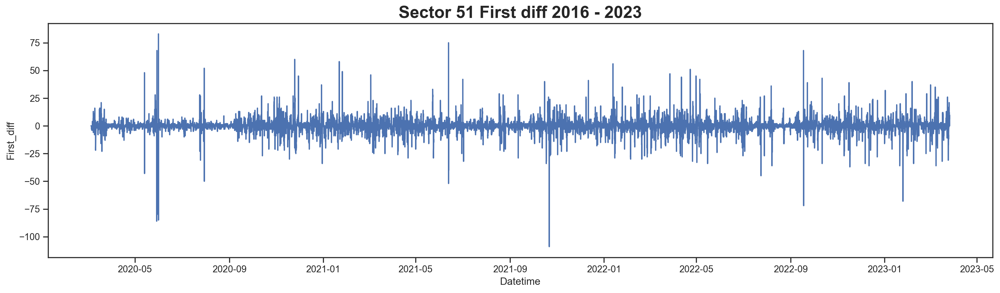

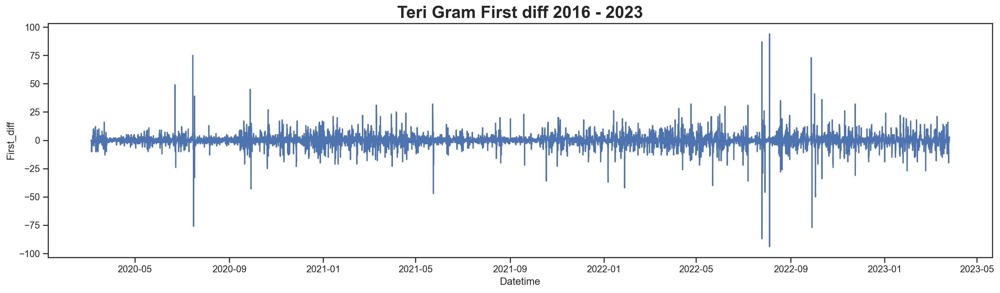

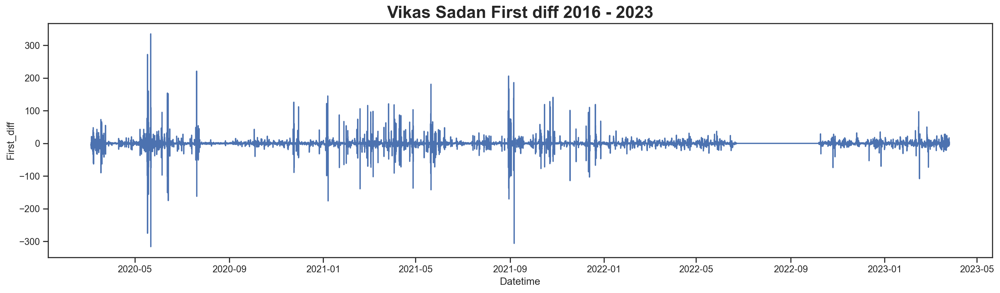

In [63]:
for i in range(len(Stations)):
    plt.figure(figsize=(20,5))
    sns.lineplot(data = dataframes[i]['First_diff'], errorbar=None)
    plt.title(Stations[i]+' First diff 2016 - 2023', fontdict= {"fontsize": 20, "fontweight": "bold"})
    

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='First_diff', ylabel='Lag_1'>

Text(0.5, 1.0, 'NISE First_diff vs Lag_1 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='First_diff', ylabel='Lag_1'>

Text(0.5, 1.0, 'No Station First_diff vs Lag_1 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='First_diff', ylabel='Lag_1'>

Text(0.5, 1.0, 'Sector 51 First_diff vs Lag_1 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='First_diff', ylabel='Lag_1'>

Text(0.5, 1.0, 'Teri Gram First_diff vs Lag_1 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='First_diff', ylabel='Lag_1'>

Text(0.5, 1.0, 'Vikas Sadan First_diff vs Lag_1 2016 - 2023')

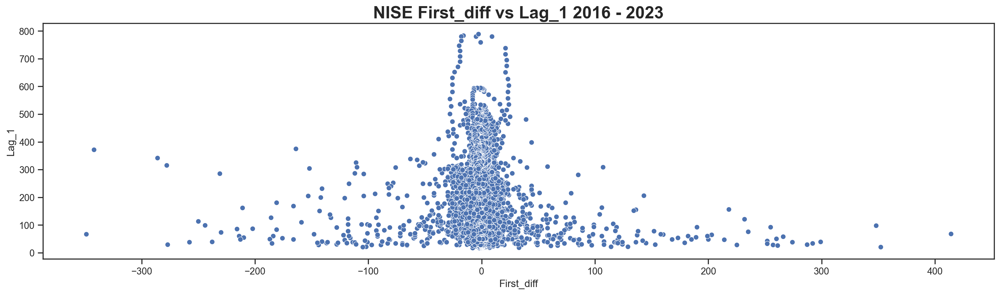

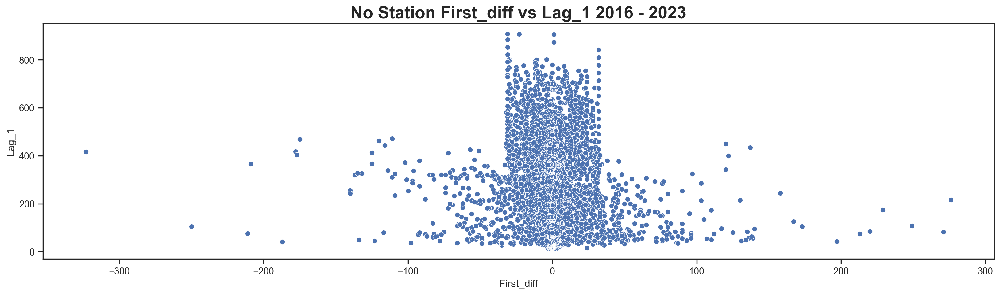

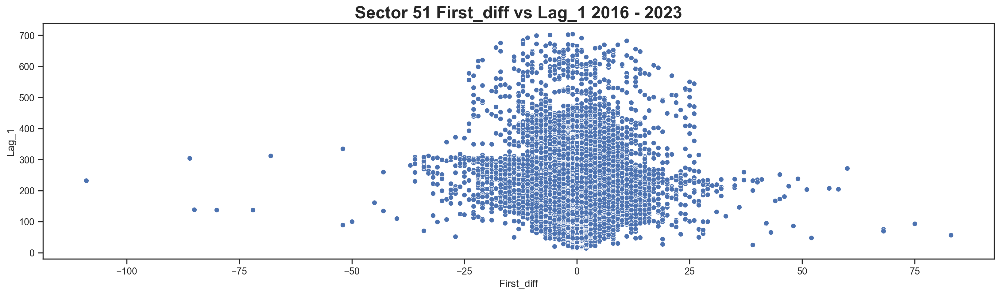

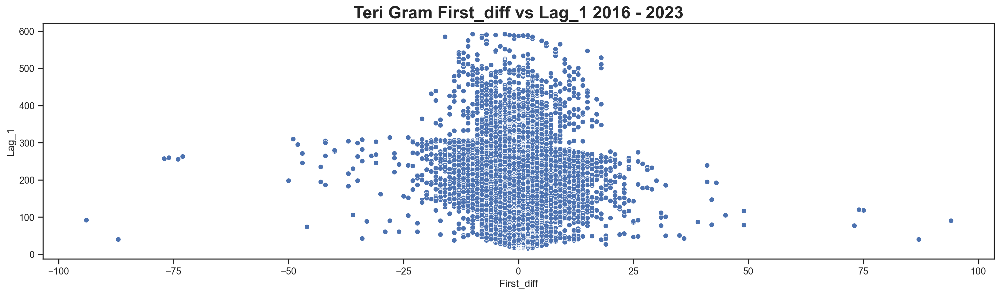

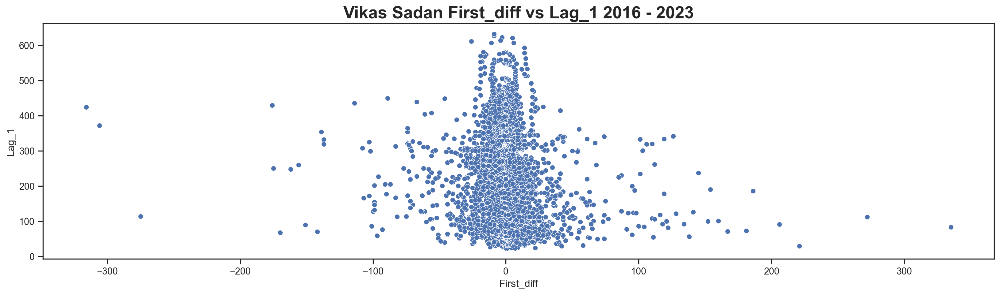

In [69]:
for i in range(len(Stations)):
    plt.figure(figsize=(20,5))
    sns.scatterplot(data = dataframes[i], x = 'First_diff', y='Lag_1')
    plt.title(Stations[i]+' First_diff vs Lag_1 2016 - 2023', fontdict= {"fontsize": 20, "fontweight": "bold"})
    

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='AQI', ylabel='Lag_1'>

Text(0.5, 1.0, 'NISE AQI vs Lag_1 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='AQI', ylabel='Lag_1'>

Text(0.5, 1.0, 'No Station AQI vs Lag_1 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='AQI', ylabel='Lag_1'>

Text(0.5, 1.0, 'Sector 51 AQI vs Lag_1 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='AQI', ylabel='Lag_1'>

Text(0.5, 1.0, 'Teri Gram AQI vs Lag_1 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

<AxesSubplot: xlabel='AQI', ylabel='Lag_1'>

Text(0.5, 1.0, 'Vikas Sadan AQI vs Lag_1 2016 - 2023')

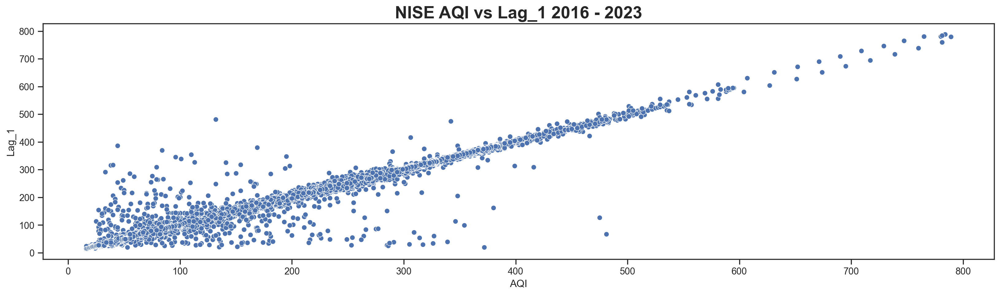

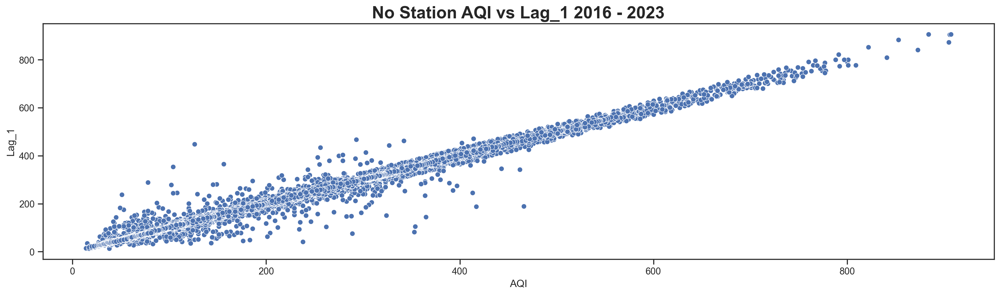

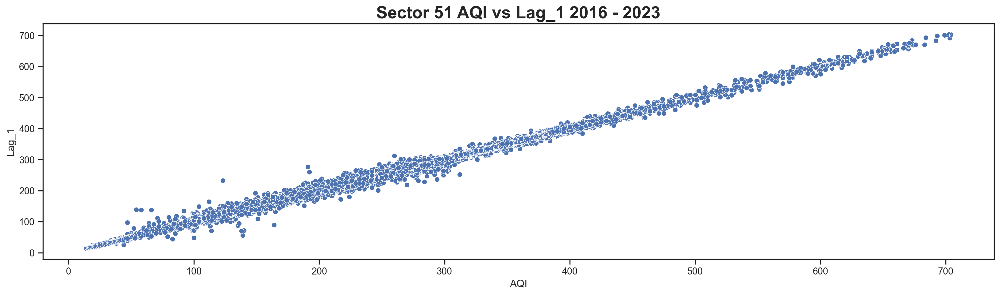

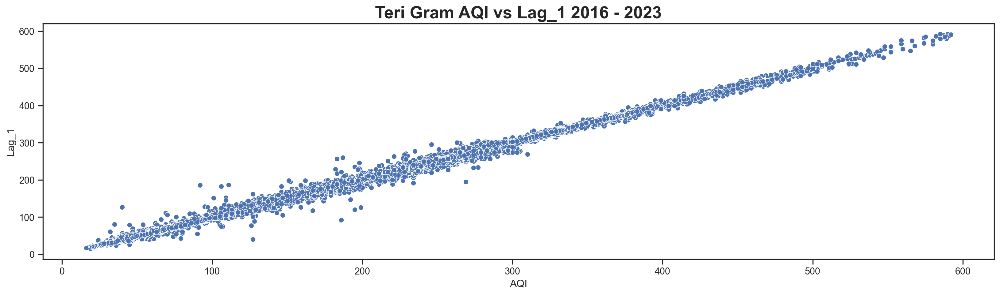

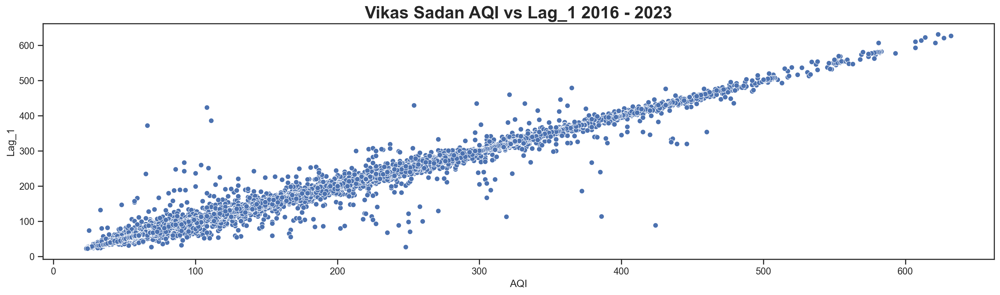

In [64]:
for i in range(len(Stations)):
    plt.figure(figsize=(20,5))
    sns.scatterplot(data = dataframes[i], x = 'AQI', y='Lag_1')
    plt.title(Stations[i]+' AQI vs Lag_1 2016 - 2023', fontdict= {"fontsize": 20, "fontweight": "bold"})
    

<Figure size 2000x500 with 0 Axes>

Text(0.5, 1.0, 'NISE AQI vs Lag_1 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

Text(0.5, 1.0, 'No Station AQI vs Lag_1 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

Text(0.5, 1.0, 'Sector 51 AQI vs Lag_1 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

Text(0.5, 1.0, 'Teri Gram AQI vs Lag_1 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

Text(0.5, 1.0, 'Vikas Sadan AQI vs Lag_1 2016 - 2023')

<Figure size 2000x500 with 0 Axes>

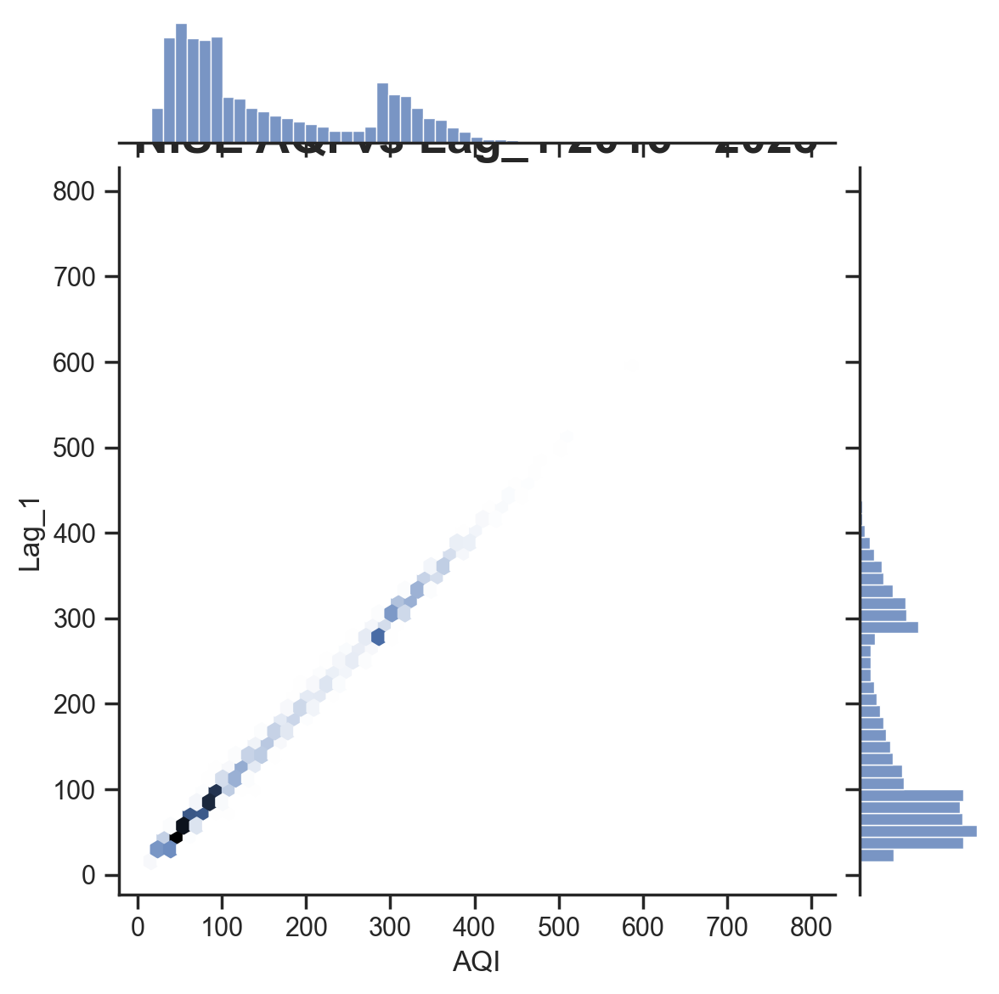

<Figure size 2000x500 with 0 Axes>

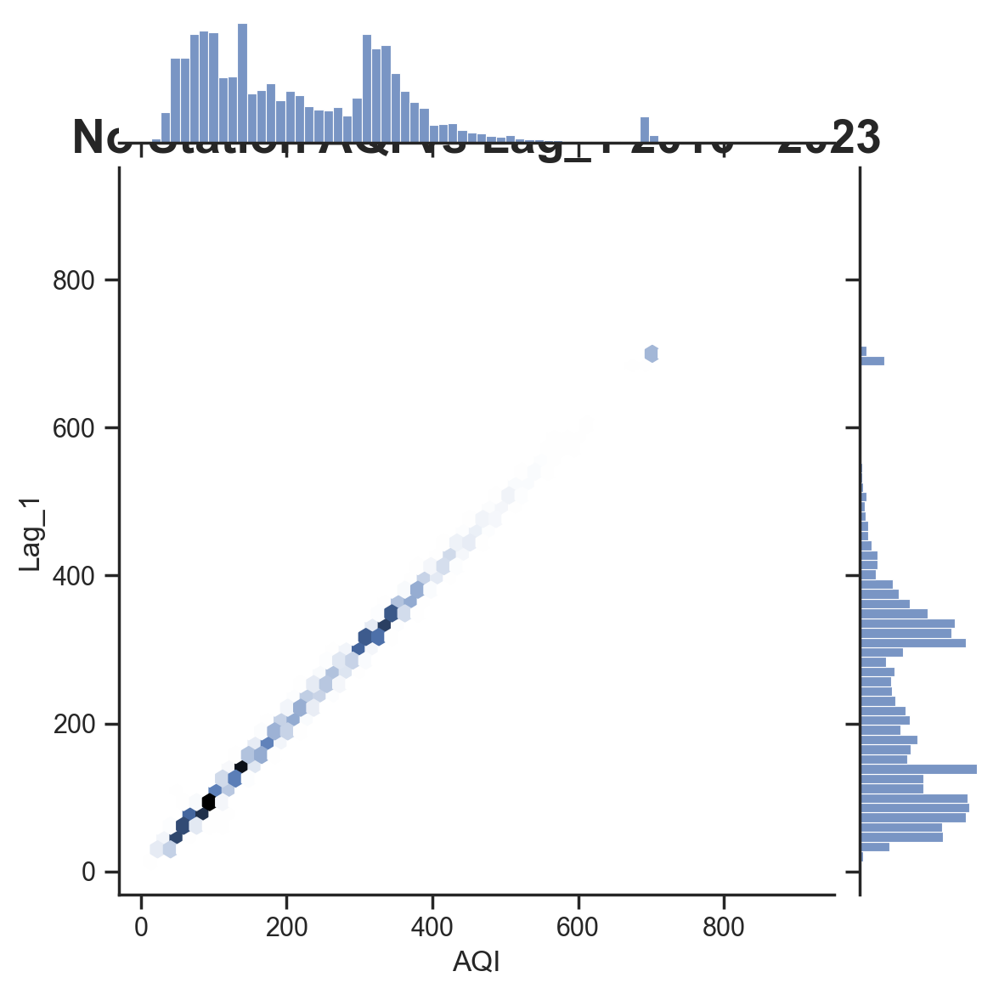

<Figure size 2000x500 with 0 Axes>

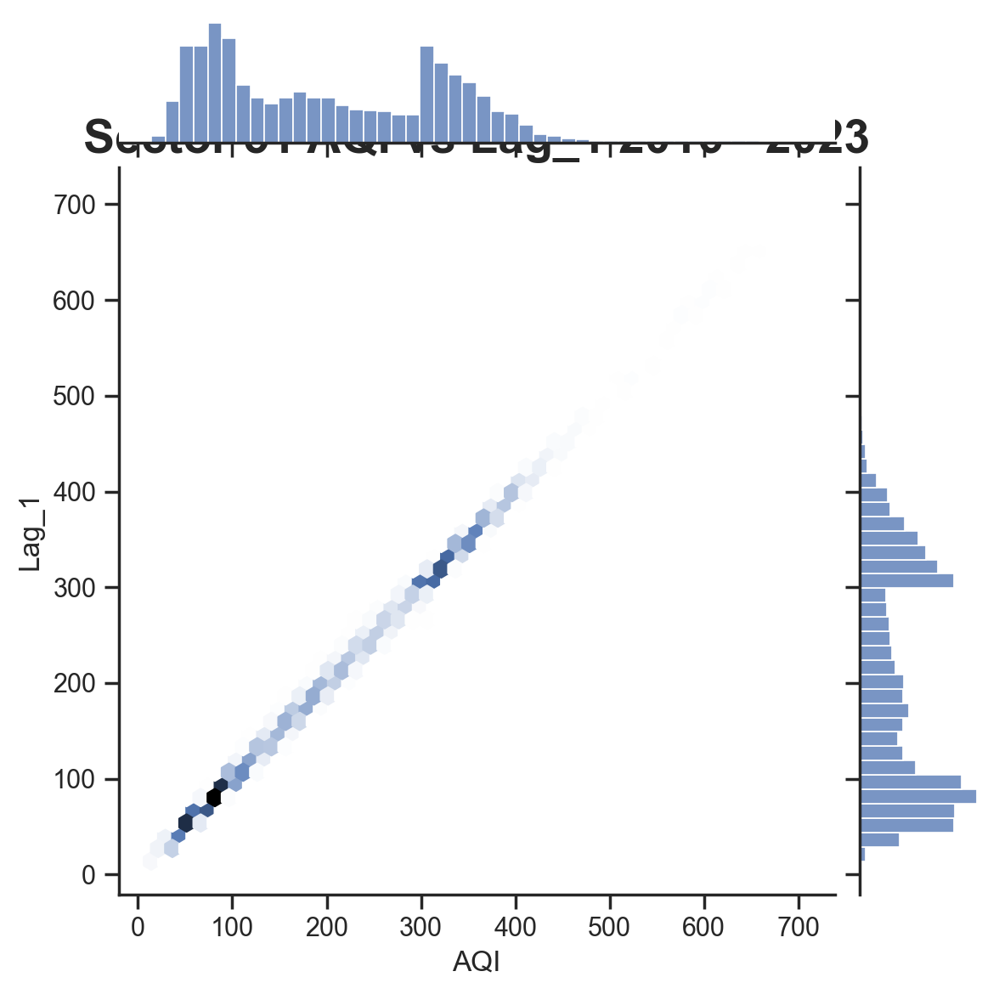

<Figure size 2000x500 with 0 Axes>

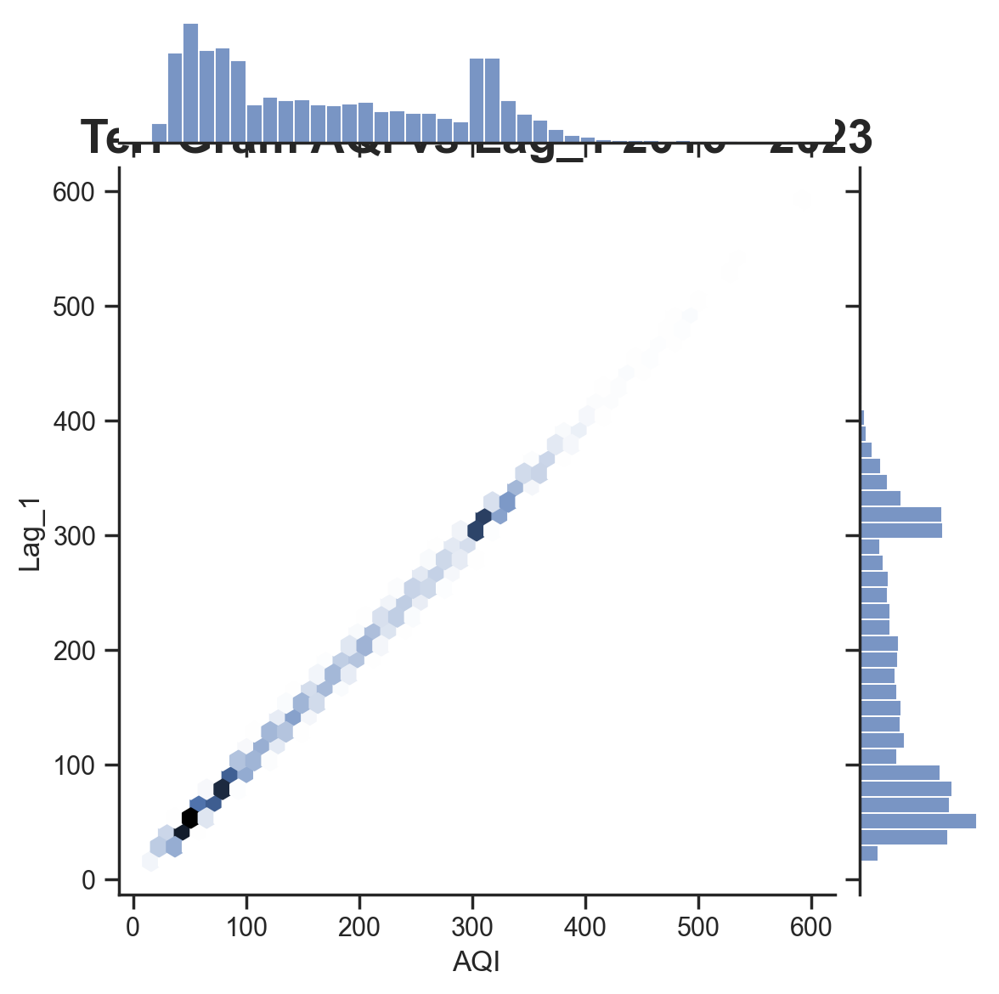

<Figure size 2000x500 with 0 Axes>

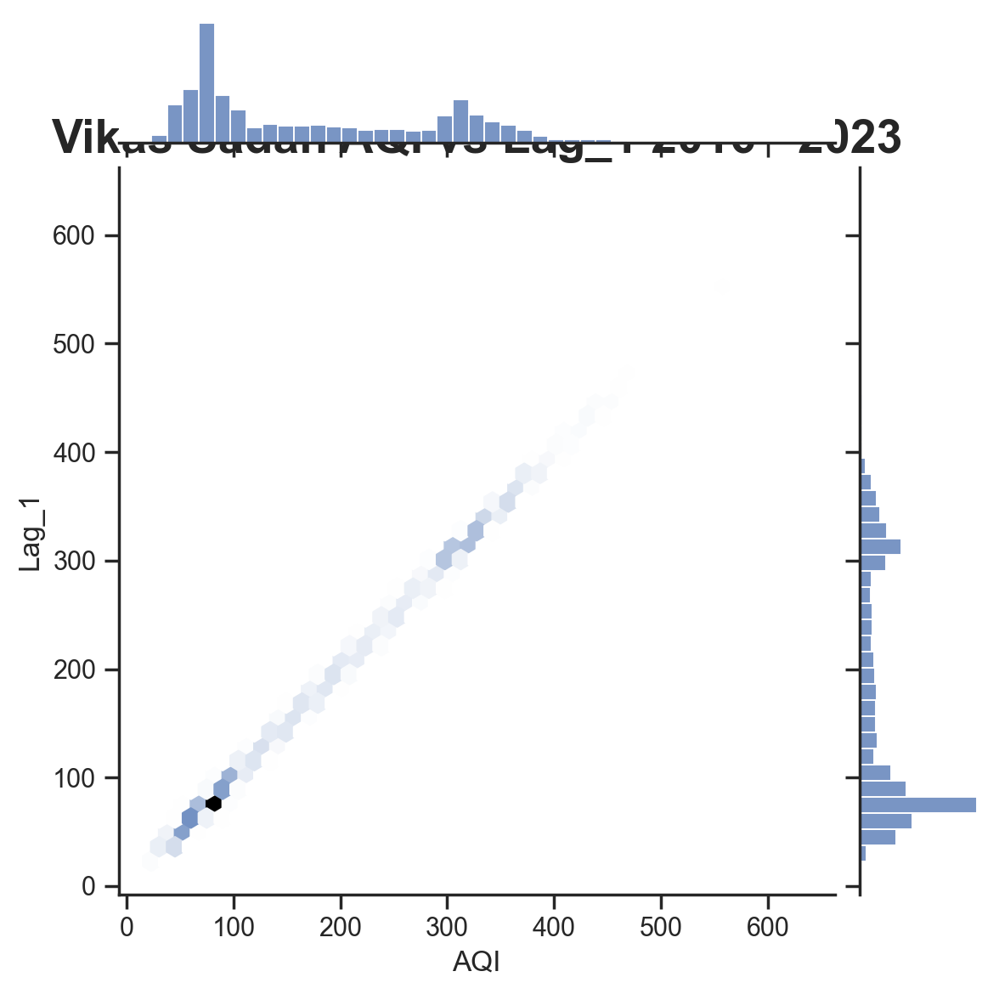

In [66]:
for i in range(len(Stations)):
    plt.figure(figsize=(20,5))
    sns.jointplot(data=dataframes[i], x = 'AQI', y='Lag_1',kind='hex')
    plt.title(Stations[i]+' AQI vs Lag_1 2016 - 2023', fontdict= {"fontsize": 20, "fontweight": "bold"})

<Figure size 1400x800 with 0 Axes>

<AxesSubplot: xlabel='Datetime', ylabel='First_diff'>

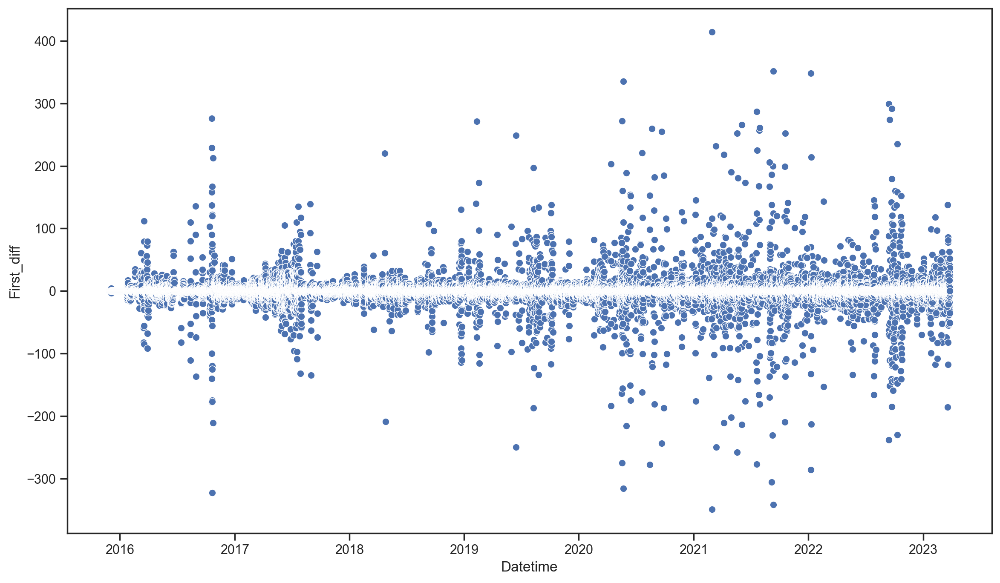

In [104]:
plt.figure(figsize=(14,8))
sns.scatterplot(data = df, x = df.index, y='First_diff')

In [17]:
df_nise.head()

,AQI,Lag_1,First_diff
Datetime,,,
2020-03-04 23:00:00,145.0,NaN,-10.0
2020-03-05 00:00:00,135.0,145.0,-8.0
2020-03-05 01:00:00,127.0,135.0,-8.0
2020-03-05 02:00:00,119.0,127.0,-11.0
2020-03-05 03:00:00,108.0,119.0,-9.0


In [71]:
df_nise.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 26793 entries, 2020-03-04 23:00:00 to 2023-03-26 07:00:00
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   AQI         26793 non-null  float64
 1   Lag_1       26792 non-null  float64
 2   First_diff  26793 non-null  float64
dtypes: float64(3)
memory usage: 837.3 KB


In [18]:
#Remove NaN in lag 1
for i in range(len(Stations)):
    dataframes[i].dropna(inplace=True)

In [19]:
df_nise.head(2)
df_sector_51.head(2)

,AQI,Lag_1,First_diff
Datetime,,,
2020-03-05 00:00:00,135.0,145.0,-8.0
2020-03-05 01:00:00,127.0,135.0,-8.0


,AQI,Lag_1,First_diff
Datetime,,,
2020-03-05 00:00:00,103.0,103.0,0.0
2020-03-05 01:00:00,103.0,103.0,0.0


In [20]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import acf, pacf

Text(0.5, 1.0, 'NISE ACF')

Text(0.5, 1.0, 'No Station ACF')

Text(0.5, 1.0, 'Sector 51 ACF')

Text(0.5, 1.0, 'Teri Gram ACF')

Text(0.5, 1.0, 'Vikas Sadan ACF')

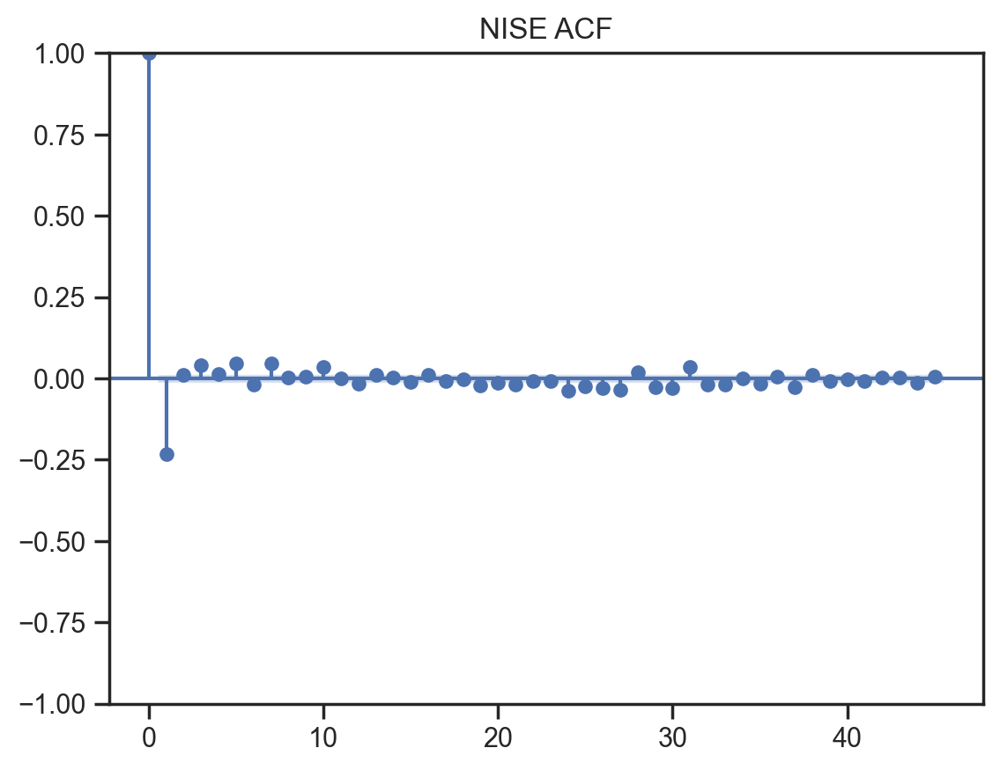

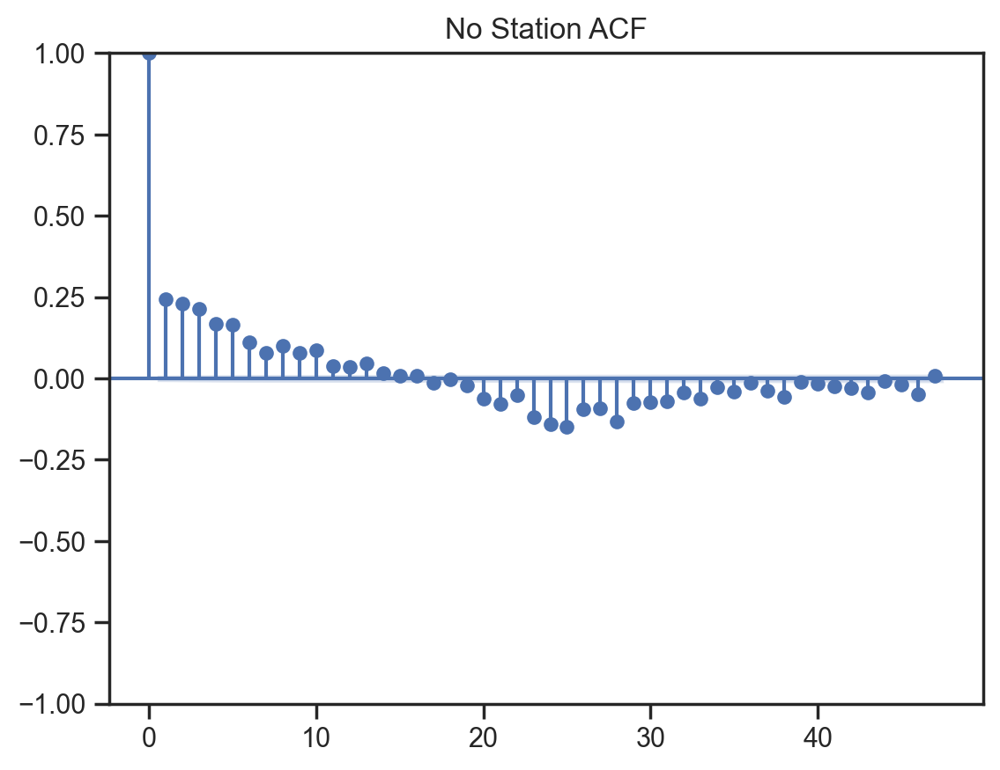

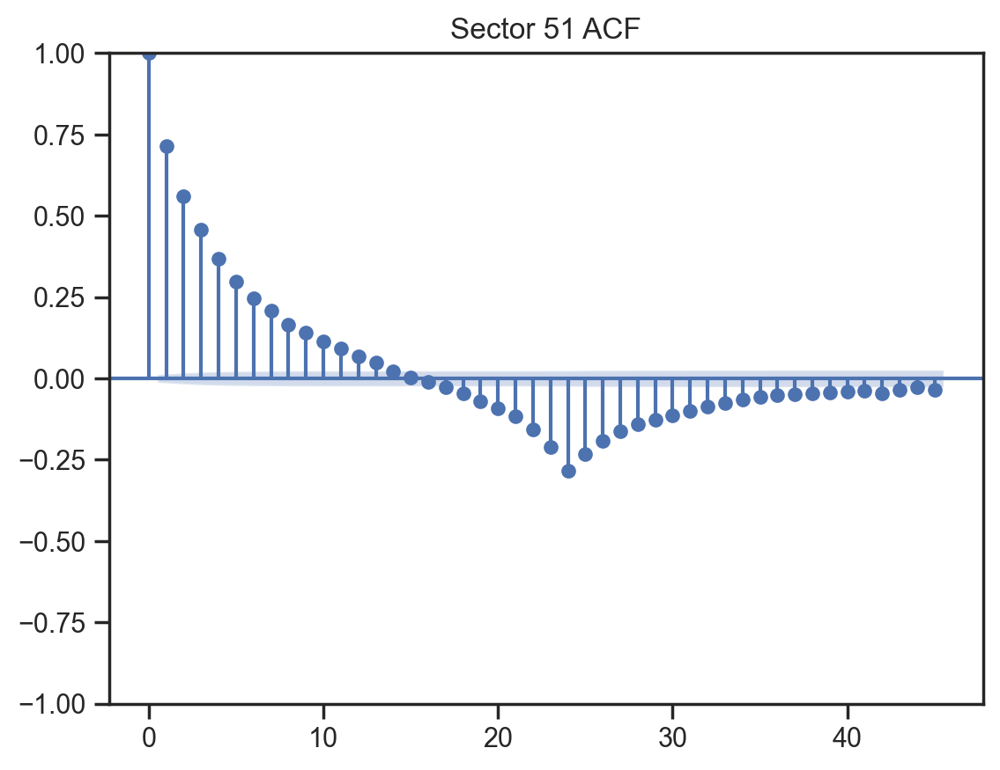

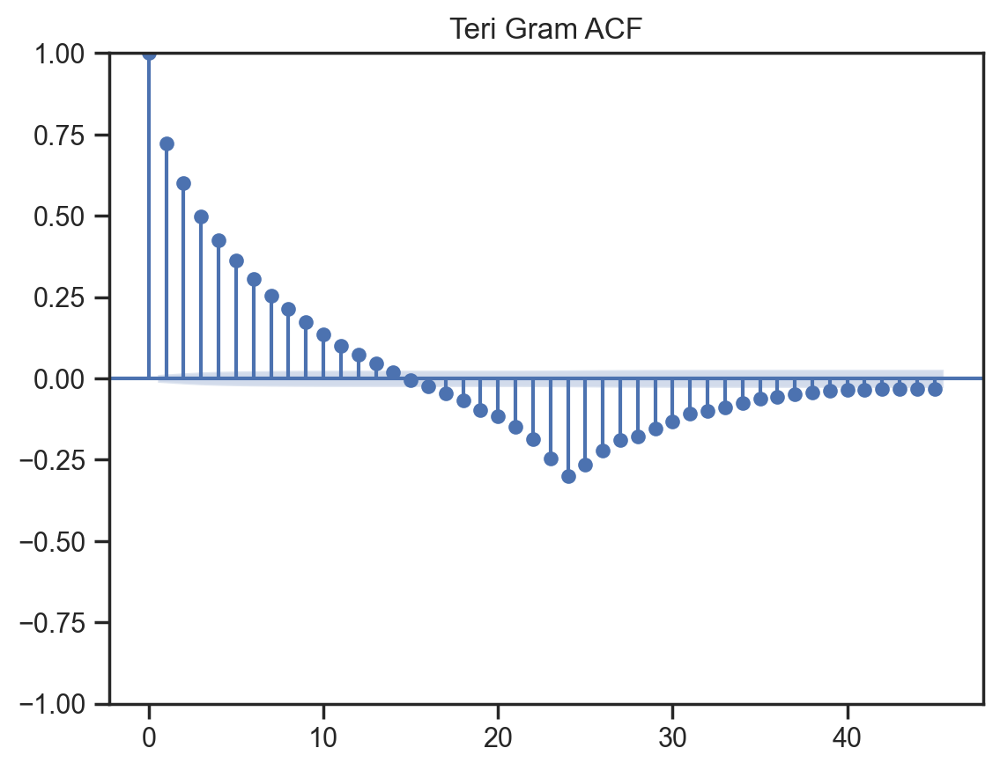

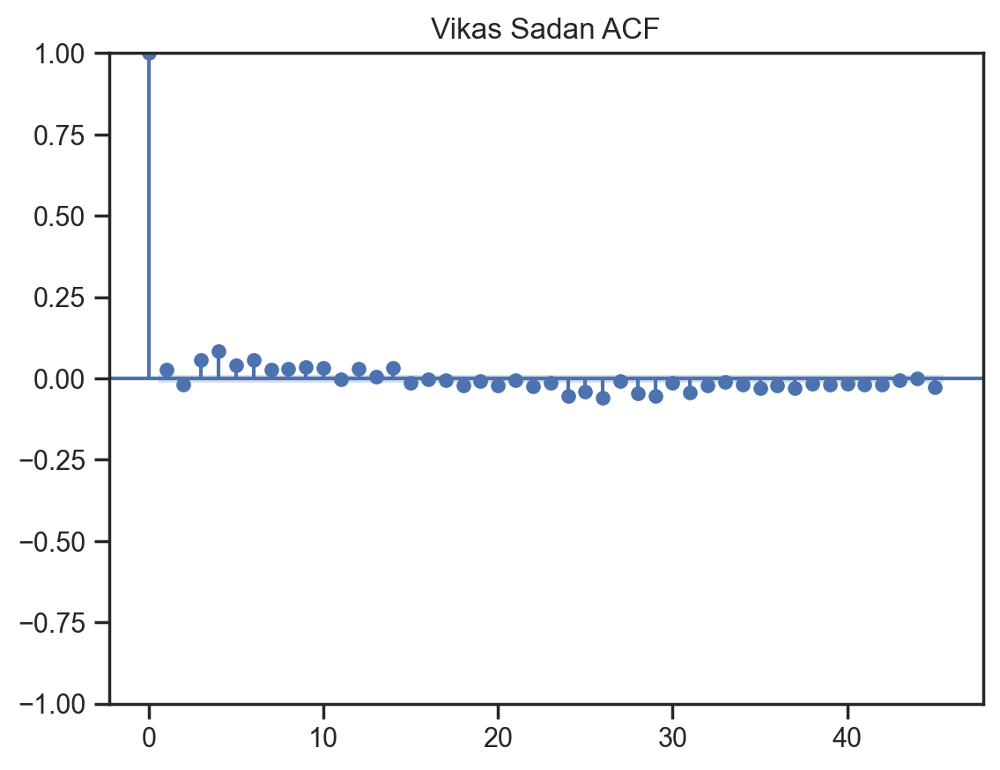

In [78]:
for i in range(len(Stations)):
    a = plot_acf(dataframes[i]['First_diff'])
    plt.title(Stations[i] + " ACF")

<BarContainer object of 50 artists>

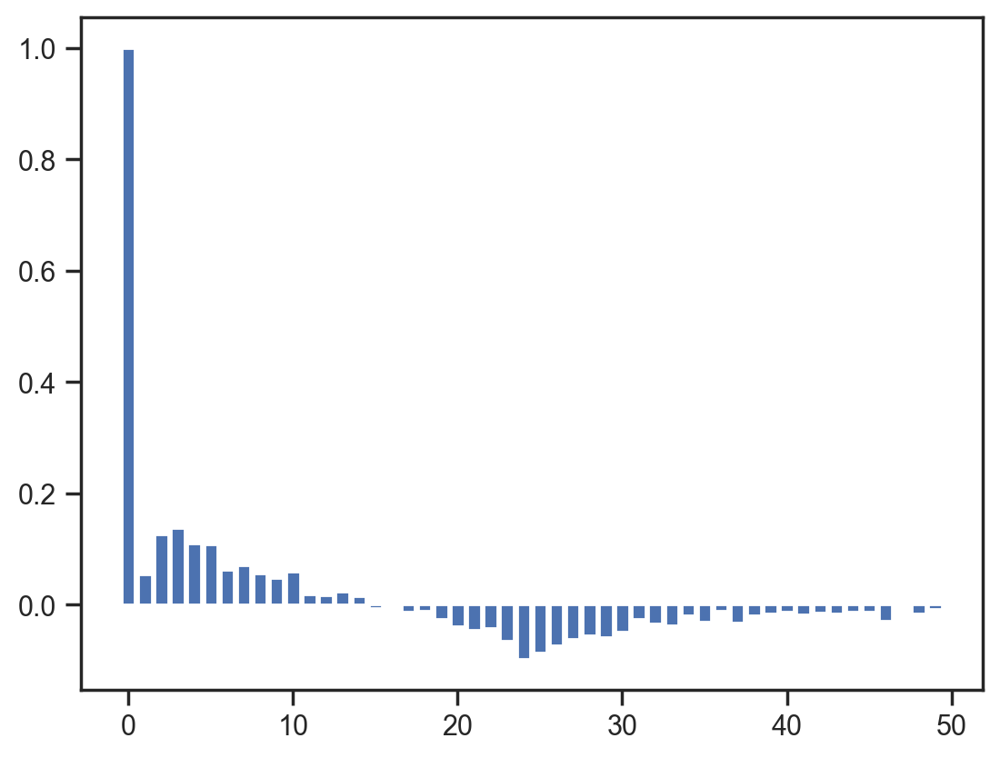

In [21]:
acf_vals = acf(df['First_diff'])
num_lags = 50
plt.bar(range(num_lags), acf_vals[:num_lags])

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/graphics/tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


Text(0.5, 1.0, 'NISE PACF')

Text(0.5, 1.0, 'No Station PACF')

Text(0.5, 1.0, 'Sector 51 PACF')

Text(0.5, 1.0, 'Teri Gram PACF')

Text(0.5, 1.0, 'Vikas Sadan PACF')

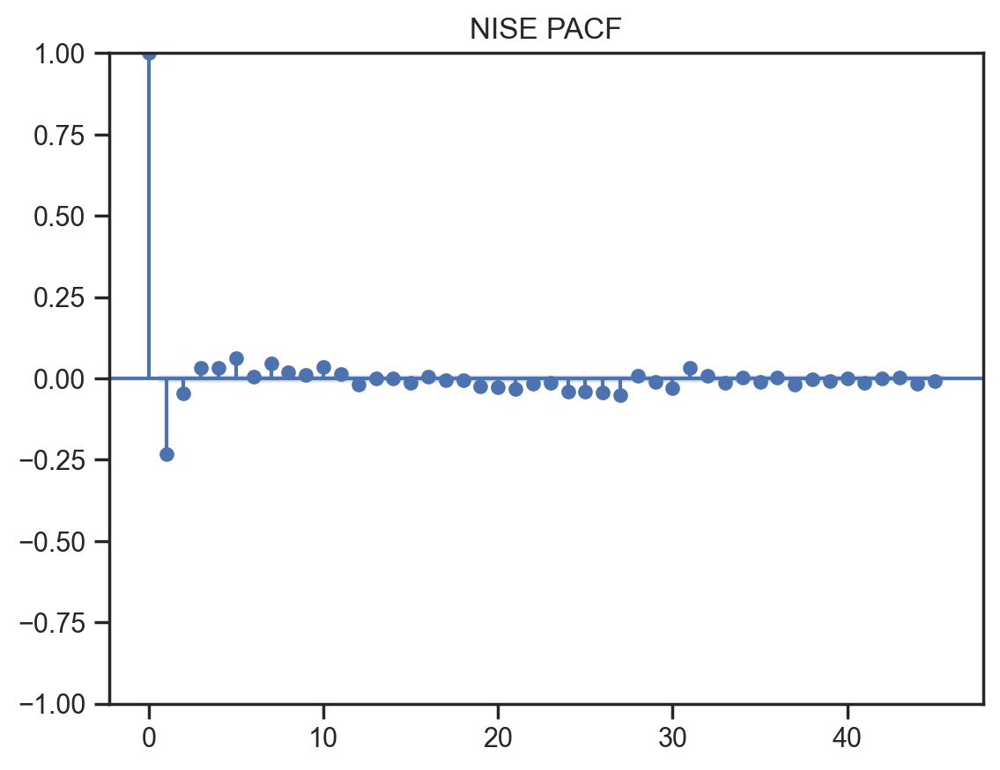

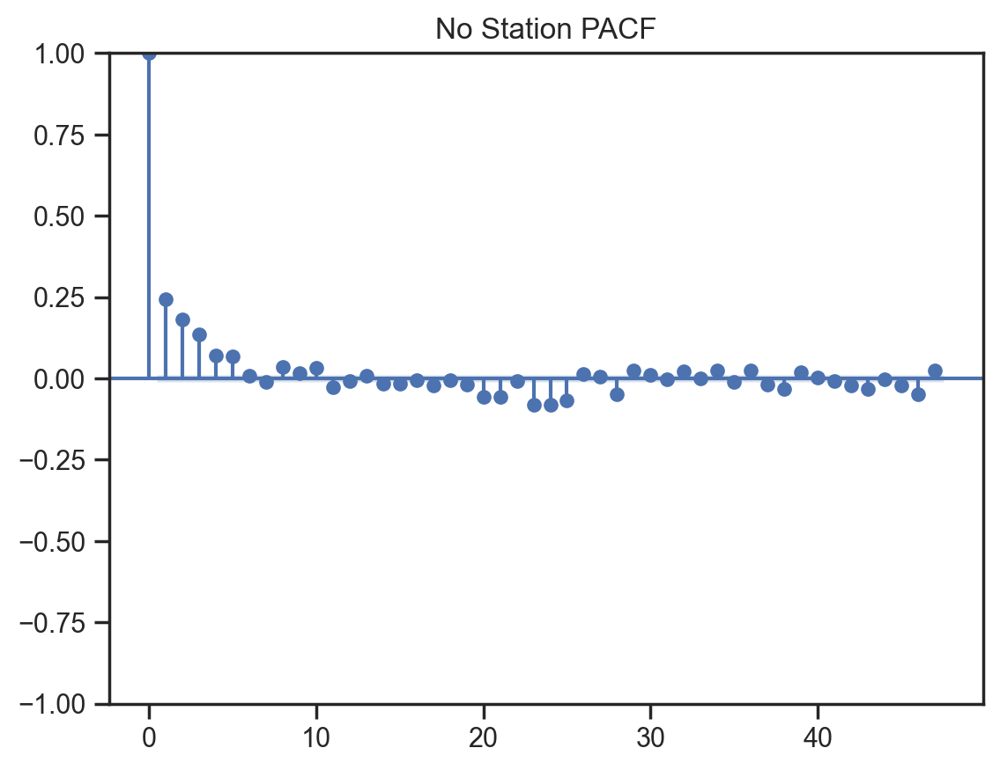

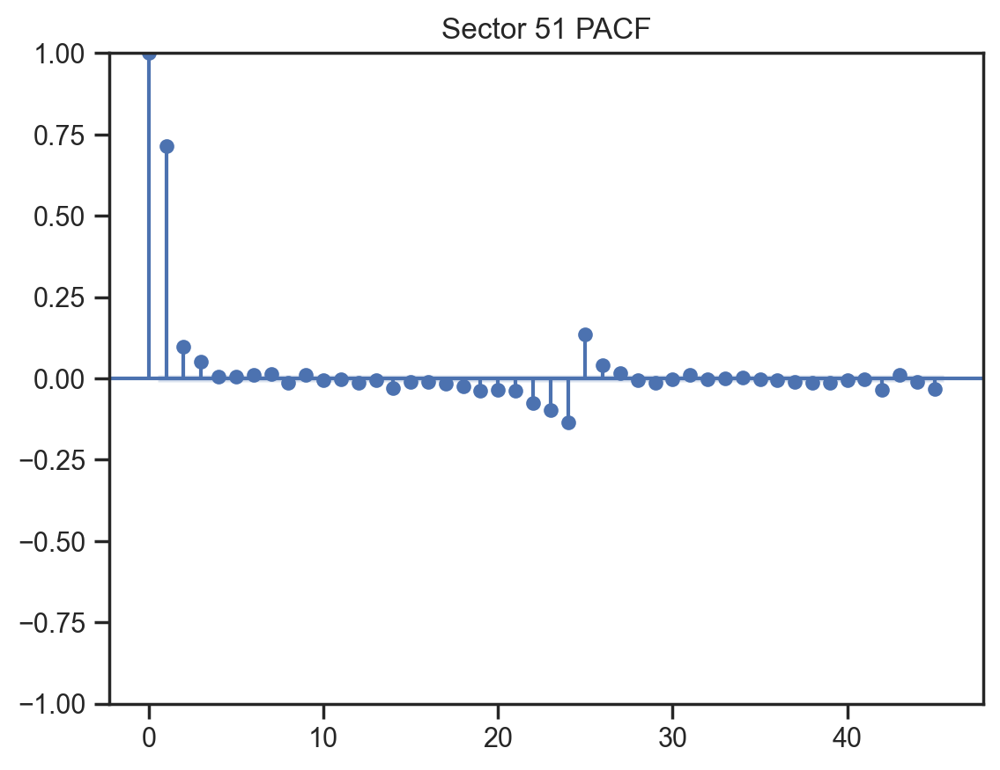

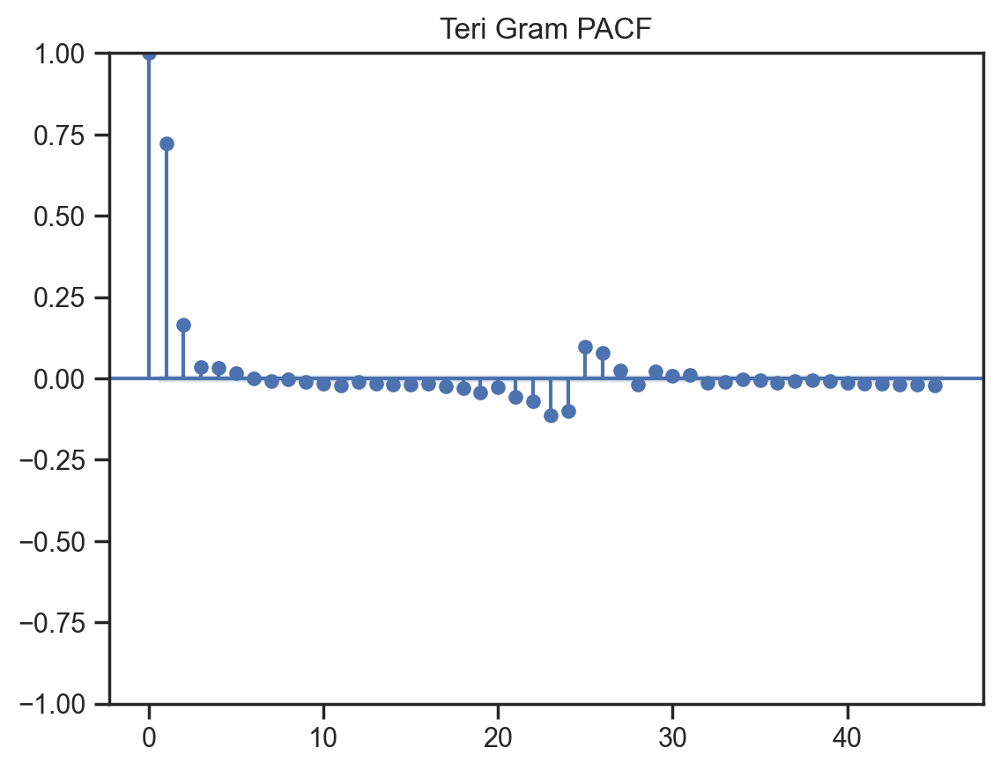

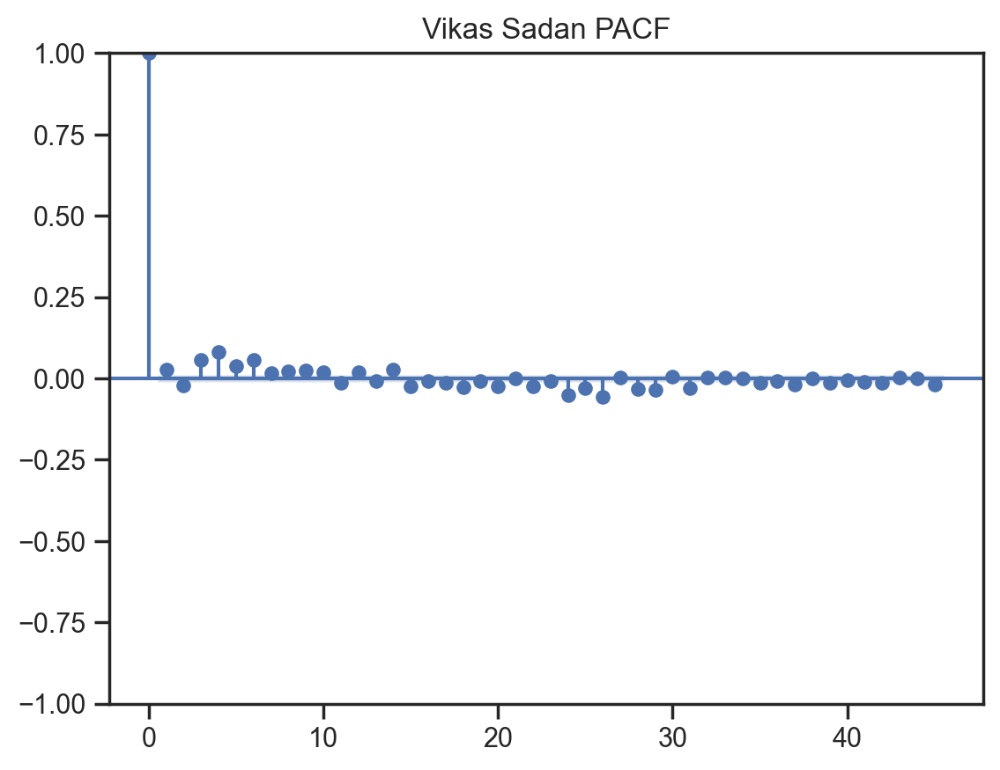

In [79]:
for i in range(len(Stations)):
    a = plot_pacf(dataframes[i]['First_diff'])
    plt.title(Stations[i] + " PACF")

In [21]:
from datetime import datetime
from datetime import timedelta
from pandas.plotting import register_matplotlib_converters
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.arima.model import ARIMA 

In [22]:
from statsmodels.tsa.stattools import adfuller
from pandas.plotting import autocorrelation_plot

In [37]:
df_sector_51

,AQI,Lag_1,First_diff
Datetime,,,
2020-03-05 00:00:00,103.0,103.0,0.0
2020-03-05 01:00:00,103.0,103.0,0.0
2020-03-05 02:00:00,103.0,103.0,0.0
2020-03-05 03:00:00,103.0,103.0,0.0
2020-03-05 04:00:00,103.0,103.0,0.0
...,...,...,...
2023-03-26 12:00:00,213.0,205.0,10.0
2023-03-26 13:00:00,223.0,213.0,9.0
2023-03-26 14:00:00,232.0,223.0,9.0


In [38]:
df_sector_51.to_csv("df_sector_51_only_aqi.csv")

In [24]:
train_end = datetime(2022,3,26)
test_end = datetime(2023,3,25)

train_data = df_sector_51[:train_end]['AQI']
test_data = df_sector_51[train_end + timedelta(hours=1):test_end]['AQI']

In [25]:
train_data

Datetime
2020-03-05 00:00:00    103.0
2020-03-05 01:00:00    103.0
2020-03-05 02:00:00    103.0
2020-03-05 03:00:00    103.0
2020-03-05 04:00:00    103.0
                       ...  
2022-03-25 20:00:00    214.0
2022-03-25 21:00:00    207.0
2022-03-25 22:00:00    202.0
2022-03-25 23:00:00    200.0
2022-03-26 00:00:00    199.0
Name: AQI, Length: 18025, dtype: float64

In [26]:
test_data

Datetime
2022-03-26 01:00:00    200.0
2022-03-26 02:00:00    206.0
2022-03-26 03:00:00    215.0
2022-03-26 04:00:00    221.0
2022-03-26 05:00:00    224.0
                       ...  
2023-03-24 20:00:00    276.0
2023-03-24 21:00:00    250.0
2023-03-24 22:00:00    219.0
2023-03-24 23:00:00    197.0
2023-03-25 00:00:00    180.0
Name: AQI, Length: 8736, dtype: float64

In [56]:
# Sector 51
# ACF 24 MA
# PACF 24 AR

# So use ARMA(24, 24)

# model = ARIMA(train_data, order=(1,0,0))
model = AutoReg(train_data, lags = 1)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


In [57]:
model_fit = model.fit()

In [58]:
print(model_fit.summary())

                            AutoReg Model Results                             
Dep. Variable:                    AQI   No. Observations:                18025
Model:                     AutoReg(1)   Log Likelihood              -56057.980
Method:               Conditional MLE   S.D. of innovations              5.426
Date:                Fri, 17 Nov 2023   AIC                         112121.960
Time:                        10:01:00   BIC                         112145.358
Sample:                    03-05-2020   HQIC                        112129.654
                         - 03-26-2022                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.1846      0.074      2.483      0.013       0.039       0.330
AQI.L1         0.9991      0.000   3190.162      0.000       0.998       1.000
                                    Roots           

In [59]:
#get the predictions and residuals
predictions = model_fit.predict(start=len(train_data), end=len(train_data)+len(test_data)-1, dynamic=False)

# test_predict = scaler.inverse_transform(test_predict.reshape(-1, 1))
# Y_test = scaler.inverse_transform(test)
predictions

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/deterministic.py:302: UserWarning: Only PeriodIndexes, DatetimeIndexes with a frequency set, RangesIndexes, and Index with a unit increment support extending. The index is set will contain the position relative to the data length.
  fcast_index = self._extend_index(index, steps, forecast_index)


2022-03-26 01:00:00    199.005568
2022-03-26 02:00:00    199.011131
2022-03-26 03:00:00    199.016690
2022-03-26 04:00:00    199.022243
2022-03-26 05:00:00    199.027791
                          ...    
2023-03-24 20:00:00    205.186177
2023-03-24 21:00:00    205.186179
2023-03-24 22:00:00    205.186182
2023-03-24 23:00:00    205.186184
2023-03-25 00:00:00    205.186186
Freq: H, Length: 8736, dtype: float64

In [60]:
# predictions = pd.Series(predictions, index=test_data.index)
residuals = test_data - predictions
residuals

Datetime
2022-03-26 01:00:00     0.994432
2022-03-26 02:00:00     6.988869
2022-03-26 03:00:00    15.983310
2022-03-26 04:00:00    21.977757
2022-03-26 05:00:00    24.972209
                         ...    
2023-03-24 20:00:00    70.813823
2023-03-24 21:00:00    44.813821
2023-03-24 22:00:00    13.813818
2023-03-24 23:00:00    -8.186184
2023-03-25 00:00:00   -25.186186
Length: 8736, dtype: float64

<Figure size 1000x400 with 0 Axes>

Text(0.5, 1.0, 'Residuals from AR 2 Model')

Text(0, 0.5, 'Error')

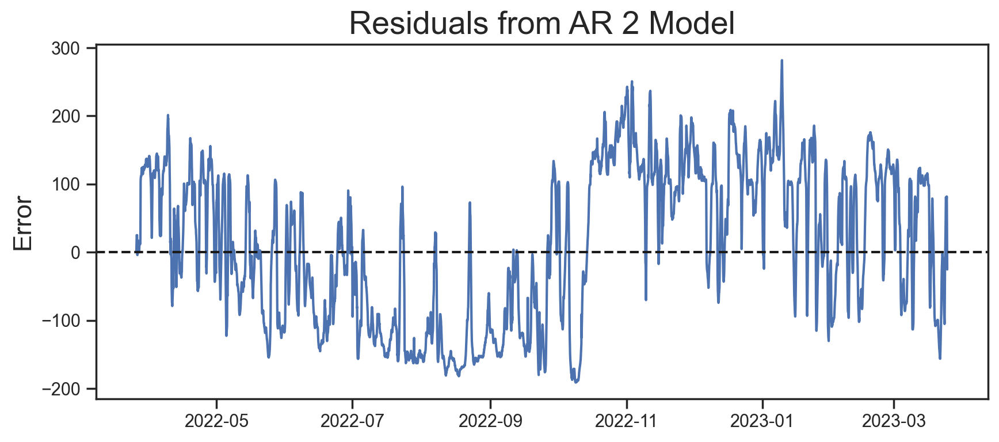

In [61]:
plt.figure(figsize=(10,4))
plt.plot(residuals)
plt.axhline(0, linestyle='--', color='k')
plt.title('Residuals from AR 2 Model', fontsize=20)
plt.ylabel('Error', fontsize=16)

<Figure size 1000x400 with 0 Axes>

Text(0, 0.5, 'Production')

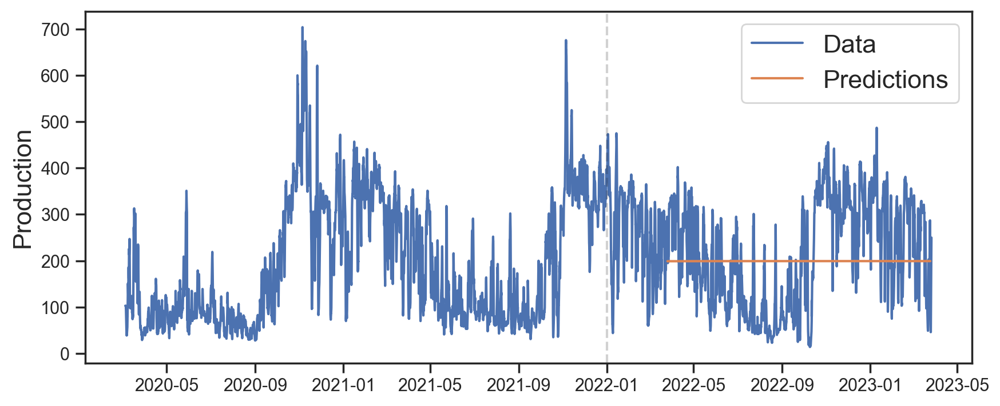

In [125]:
plt.figure(figsize=(10,4))

plt.plot(df_sector_51['AQI'])
plt.plot(predictions)

plt.legend(('Data', 'Predictions'), fontsize=16)

# plt.title('Catfish Sales in 1000s of Pounds', fontsize=20)
plt.ylabel('Production', fontsize=16)
for year in range(2022,2023):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)

In [96]:
my_order = (0,1,0)
my_seasonal_order = (1, 0, 1, 24)
# define model
model = SARIMAX(train_data, order=my_order, seasonal_order=my_seasonal_order)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


In [98]:
#fit the model
# start = time()
model_fit = model.fit()
# end = time()
# print('Model Fitting Time:', end - start)

 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.07403D+00    |proj g|=  3.46150D-02

At iterate    5    f=  3.05705D+00    |proj g|=  2.98080D-02

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      9     13      1     0     0   5.520D-06   3.056D+00
  F =   3.0563327205759148     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


In [99]:
#summary of the model
print(model_fit.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                  AQI   No. Observations:                18025
Model:             SARIMAX(0, 1, 0)x(1, 0, [1], 24)   Log Likelihood              -55090.397
Date:                              Thu, 16 Nov 2023   AIC                         110186.795
Time:                                      07:07:00   BIC                         110210.193
Sample:                                  03-05-2020   HQIC                        110194.489
                                       - 03-26-2022                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L24       0.2932      0.010     29.216      0.000       0.274       0.313
ma.S.L24      -0.61

In [100]:
#get the predictions and residuals
predictions = model_fit.forecast(len(test_data))
predictions = pd.Series(predictions, index=test_data.index)
residuals = test_data - predictions
residuals

Datetime
2022-03-26 01:00:00     1.773166
2022-03-26 02:00:00     9.436091
2022-03-26 03:00:00    19.848042
2022-03-26 04:00:00    27.641563
2022-03-26 05:00:00    32.355566
                         ...    
2023-03-24 20:00:00    63.861089
2023-03-24 21:00:00    37.861089
2023-03-24 22:00:00     6.861089
2023-03-24 23:00:00   -15.138911
2023-03-25 00:00:00   -32.138911
Length: 8736, dtype: float64

<Figure size 1000x400 with 0 Axes>

Text(0.5, 1.0, 'Residuals from SARIMA Model')

Text(0, 0.5, 'Error')

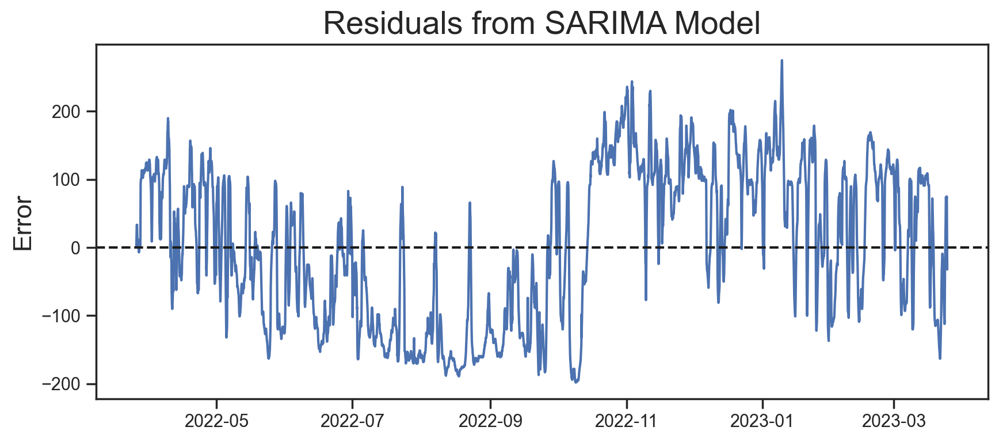

In [101]:
plt.figure(figsize=(10,4))
plt.plot(residuals)
plt.axhline(0, linestyle='--', color='k')
plt.title('Residuals from SARIMA Model', fontsize=20)
plt.ylabel('Error', fontsize=16)

<Figure size 1000x400 with 0 Axes>

Text(0, 0.5, 'Production')

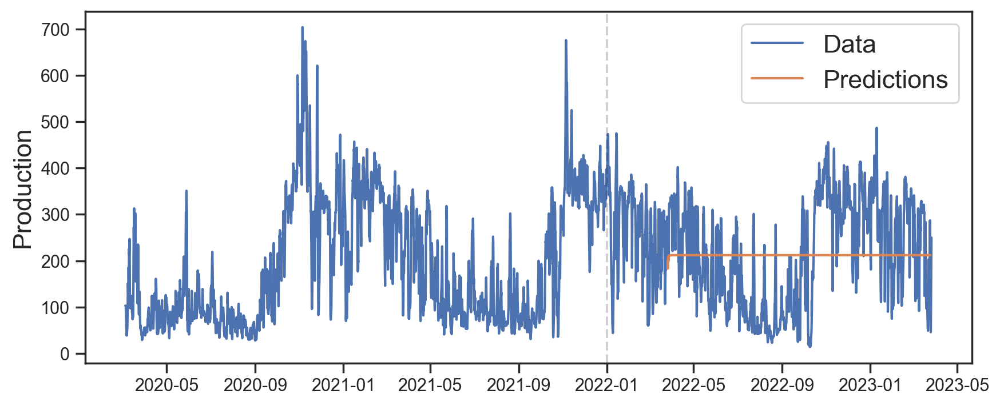

In [105]:
plt.figure(figsize=(10,4))

plt.plot(df_sector_51['AQI'])
plt.plot(predictions)

plt.legend(('Data', 'Predictions'), fontsize=16)

# plt.title('Catfish Sales in 1000s of Pounds', fontsize=20)
plt.ylabel('Production', fontsize=16)
for year in range(2022,2023):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)

In [106]:
print('Mean Absolute Percent Error:', round(np.mean(abs(residuals/test_data)),4))


Mean Absolute Percent Error: 0.9234


<AxesSubplot: xlabel='Lag', ylabel='Autocorrelation'>

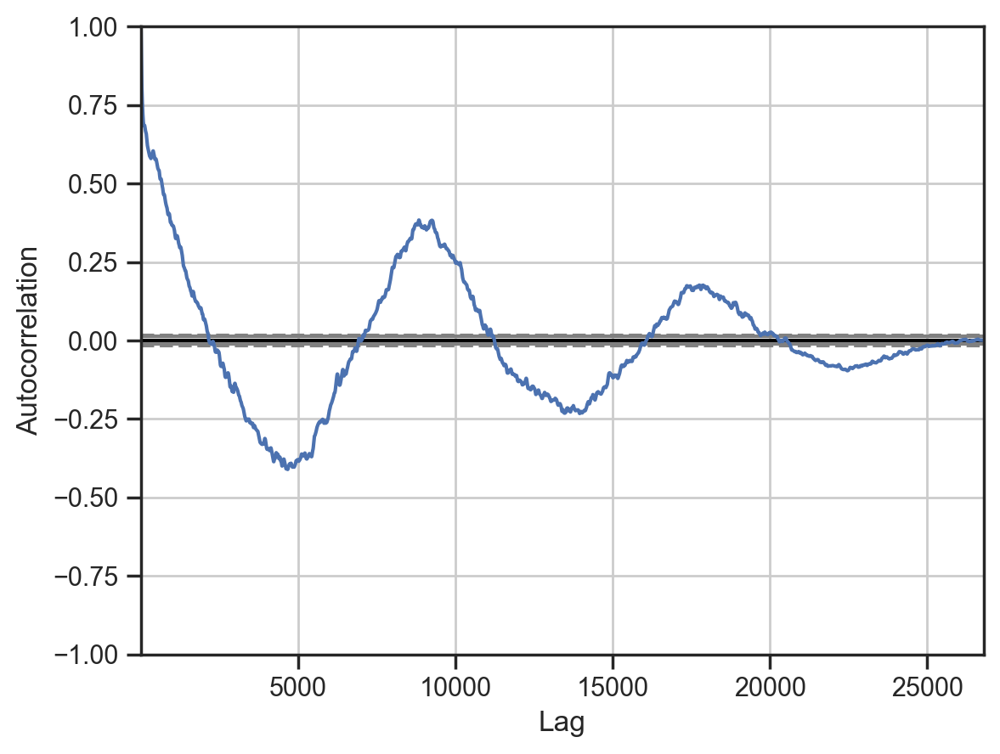

In [82]:
autocorrelation_plot(df_sector_51['AQI'])

In [102]:
acf_value = acf(df['First_diff'])
pacf_value = pacf(df['First_diff'])
acf_value
pacf_value
# The same values are plotted below

array([ 1.00000000e+00,  5.40651044e-02,  1.25641599e-01,  1.37585259e-01,
        1.10647243e-01,  1.07678429e-01,  6.34662799e-02,  7.12487527e-02,
        5.54720053e-02,  4.82224790e-02,  5.89664528e-02,  1.94002555e-02,
        1.63363666e-02,  2.37074958e-02,  1.49677548e-02, -5.01886456e-03,
        4.12268380e-03, -1.18441408e-02, -1.15207733e-02, -2.52048816e-02,
       -3.81101834e-02, -4.48061127e-02, -4.15910081e-02, -6.40531452e-02,
       -9.72630562e-02, -8.55826787e-02, -7.30870709e-02, -6.07090513e-02,
       -5.53752802e-02, -5.77812487e-02, -4.90000650e-02, -2.47969057e-02,
       -3.32718579e-02, -3.60897435e-02, -1.87531599e-02, -3.08473184e-02,
       -1.11044794e-02, -3.25093268e-02, -1.92770008e-02, -1.49700472e-02,
       -1.29407910e-02, -1.79941429e-02, -1.47130745e-02, -1.55824383e-02,
       -1.17592455e-02, -1.25001945e-02, -2.85972984e-02, -2.53745174e-04,
       -1.50392392e-02, -7.29634520e-03, -9.59483578e-03, -8.24457954e-03])

array([ 1.00000000e+00,  5.40654712e-02,  1.23080000e-01,  1.27271173e-01,
        8.76702357e-02,  7.33649373e-02,  2.12874785e-02,  2.68638143e-02,
        1.45568216e-02,  1.13698235e-02,  2.63066741e-02, -1.08864344e-02,
       -1.39220970e-02,  1.73868000e-04, -1.84261973e-03, -1.95727382e-02,
       -5.34579102e-03, -1.79610243e-02, -1.39267058e-02, -2.37234218e-02,
       -3.32304072e-02, -3.51802145e-02, -2.45019786e-02, -4.31588725e-02,
       -7.31111734e-02, -5.40708016e-02, -3.07200190e-02, -8.96522722e-03,
       -5.92007555e-04, -5.87314758e-03, -2.85692698e-03,  1.92337937e-02,
        5.74917214e-03, -2.88616634e-03,  1.07484886e-02, -7.47447213e-03,
        7.43991975e-03, -1.61352873e-02, -6.36868555e-03, -3.33181991e-03,
       -1.70659188e-03, -1.23613832e-02, -9.13167024e-03, -1.32989990e-02,
       -1.27786718e-02, -1.42498523e-02, -3.24947305e-02, -4.30473353e-03,
       -1.98510951e-02, -1.39317011e-02, -1.55308715e-02, -9.83548406e-03])

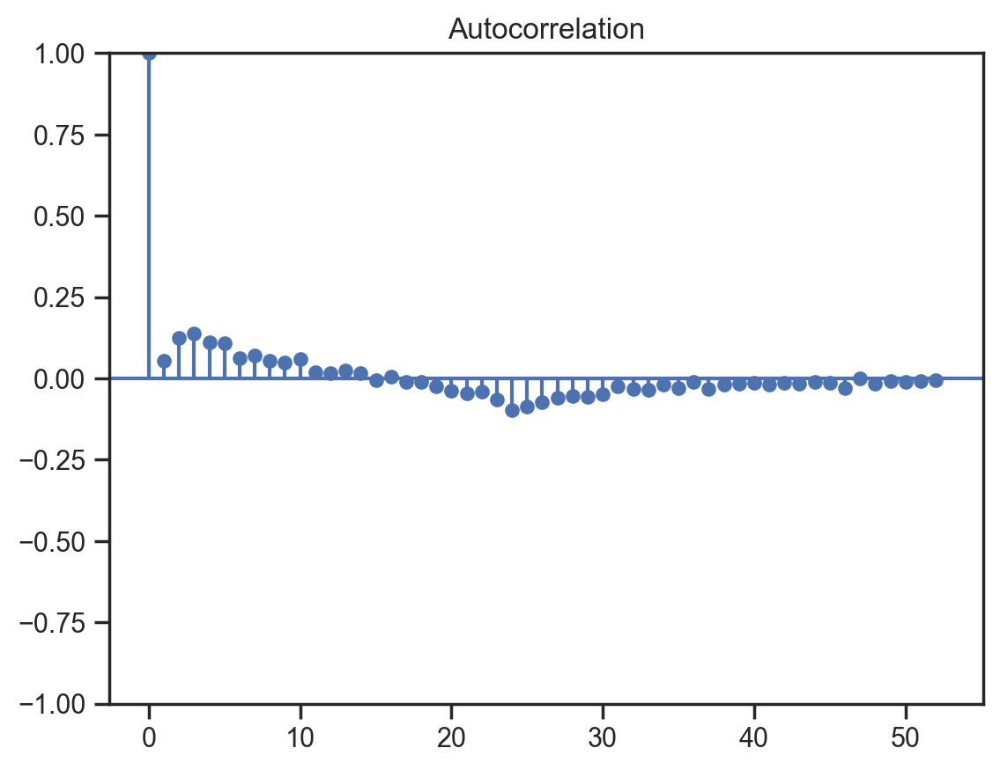

In [103]:
acf_plot = plot_acf(df['First_diff'])

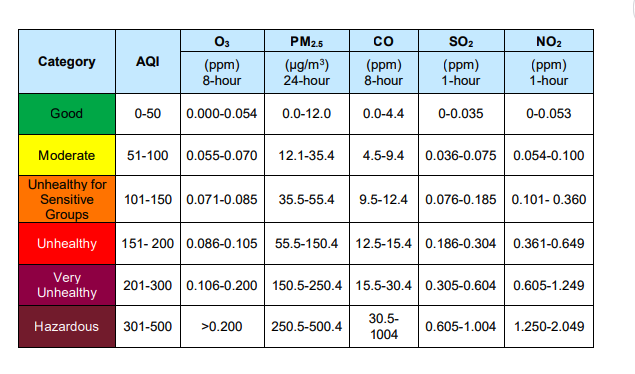

In [11]:
from pmdarima import auto_arima
from statsmodels.tsa.ar_model import AR

In [ ]:
stepwise_fit = auto_arima(
    df_sector_51['AQI'],
    suppress_warnings=True,
    d=1,  # non-seasonal difference order
    start_p=0,  # initial guess for p
    start_q=0,  # initial guess for q
    max_p=2,  # max value of p to test
    max_q=2,  # max value of q to test
    seasonal=True,  # is the time series seasonal? YES
    m=24,  # the seasonal period
    #D=1, # seasonal difference order
    start_P=1,  # initial guess for P
    start_Q=1,  # initial guess for Q
    max_P=1,  # max value of P to test
    max_Q=1,  # max value of Q to test
    information_criterion='aic',  # used to select best model
    trace=True,  # print results whilst training
    error_action='ignore',  # ignore orders that don't work
    stepwise=True  # apply intelligent order search
)
stepwise_fit.summary()

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,0,1)[24] intercept   : AIC=165778.219, Time=40.27 sec
 ARIMA(0,1,0)(0,0,0)[24] intercept   : AIC=168885.902, Time=0.51 sec
 ARIMA(1,1,0)(1,0,0)[24] intercept   : AIC=148231.964, Time=23.22 sec
 ARIMA(0,1,1)(0,0,1)[24] intercept   : AIC=154816.015, Time=33.95 sec
 ARIMA(0,1,0)(0,0,0)[24]             : AIC=168883.928, Time=0.24 sec
 ARIMA(1,1,0)(0,0,0)[24] intercept   : AIC=149676.842, Time=1.48 sec
 ARIMA(1,1,0)(1,0,1)[24] intercept   : AIC=148063.481, Time=48.21 sec
 ARIMA(1,1,0)(0,0,1)[24] intercept   : AIC=148078.774, Time=23.92 sec
 ARIMA(2,1,0)(1,0,1)[24] intercept   : AIC=147754.124, Time=65.82 sec
 ARIMA(2,1,0)(0,0,1)[24] intercept   : AIC=147768.364, Time=35.33 sec
 ARIMA(2,1,0)(1,0,0)[24] intercept   : AIC=147928.460, Time=39.98 sec
 ARIMA(2,1,0)(0,0,0)[24] intercept   : AIC=149420.968, Time=1.95 sec
 ARIMA(2,1,1)(1,0,1)[24] intercept   : AIC=147676.895, Time=99.29 sec
 ARIMA(2,1,1)(0,0,1)[24] intercept   : AIC=147691.1

In [62]:
auto_arima?

In [27]:
train_data

Datetime
2020-03-05 00:00:00    103.0
2020-03-05 01:00:00    103.0
2020-03-05 02:00:00    103.0
2020-03-05 03:00:00    103.0
2020-03-05 04:00:00    103.0
                       ...  
2022-03-25 20:00:00    214.0
2022-03-25 21:00:00    207.0
2022-03-25 22:00:00    202.0
2022-03-25 23:00:00    200.0
2022-03-26 00:00:00    199.0
Name: AQI, Length: 18025, dtype: float64

In [43]:
# ARIMA(2,1,2)(1,0,1)[24]
# ARIMA(2,1,1)(0,0,1)[24]

my_order = (1,1,0)
my_seasonal_order = (1, 0, 0, 24)
# define model
model = SARIMAX(train_data, order=my_order, seasonal_order=my_seasonal_order)
model_fit = model.fit()
print(model_fit.summary())

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.76402D+00    |proj g|=  4.19832D-02


 This problem is unconstrained.



At iterate    5    f=  2.76226D+00    |proj g|=  1.31067D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3      7      9      1     0     0   9.219D-06   2.762D+00
  F =   2.7622646550705090     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
                                     SARIMAX Results                                      
Dep. Variable:                                AQI   No. Observations:                18025
Model:             SARIMAX(1, 1, 0)x(1, 0, 0, 24)   Log Likelihood              -49789.820
Date:                            Fri, 17 Nov 2023   AIC                          99585.6

In [44]:
#get the predictions and residuals
predictions = model_fit.forecast(len(test_data))
predictions = pd.Series(predictions, index=test_data.index)
residuals = test_data - predictions
residuals

Datetime
2022-03-26 01:00:00     2.130001
2022-03-26 02:00:00     9.338630
2022-03-26 03:00:00    19.521186
2022-03-26 04:00:00    26.536602
2022-03-26 05:00:00    30.219010
                         ...    
2023-03-24 20:00:00    69.133658
2023-03-24 21:00:00    43.133658
2023-03-24 22:00:00    12.133658
2023-03-24 23:00:00    -9.866342
2023-03-25 00:00:00   -26.866342
Length: 8736, dtype: float64

<Figure size 1400x400 with 0 Axes>

Text(0.5, 1.0, 'Residuals from SARIMA Model')

Text(0, 0.5, 'Error')

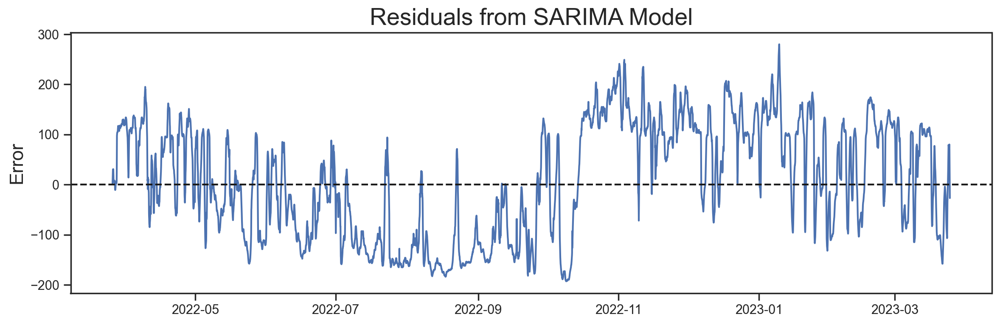

In [45]:
plt.figure(figsize=(14,4))
plt.plot(residuals)
plt.axhline(0, linestyle='--', color='k')
plt.title('Residuals from SARIMA Model', fontsize=20)
plt.ylabel('Error', fontsize=16)

<Figure size 1000x400 with 0 Axes>

Text(0, 0.5, 'Production')

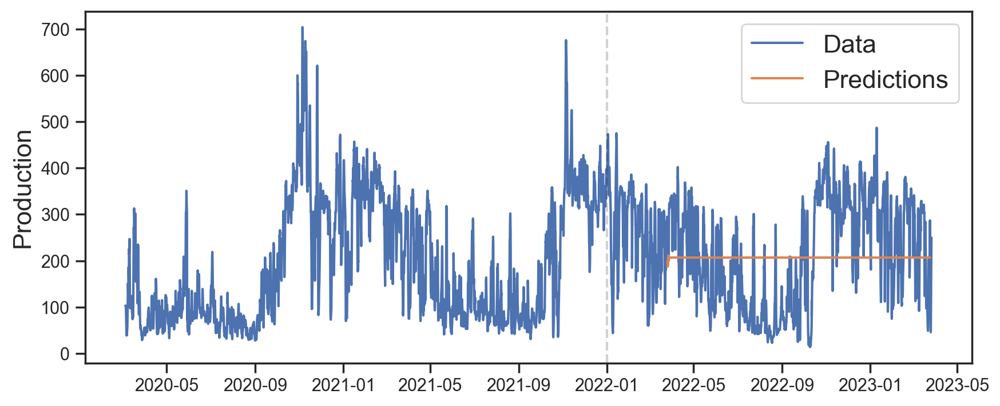

In [46]:
plt.figure(figsize=(10,4))

plt.plot(df_sector_51['AQI'])
plt.plot(predictions)

plt.legend(('Data', 'Predictions'), fontsize=16)

# plt.title('Catfish Sales in 1000s of Pounds', fontsize=20)
plt.ylabel('Production', fontsize=16)
for year in range(2022,2023):
    plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)

In [163]:
#get the predictions and residuals
start = len(train_data)
end = start + len(test_data) - 1

predictions = model_fit.predict(start=start, end = end) 
predictions = pd.Series(predictions, index=test_data.index)
residuals = test_data - predictions
residuals

Datetime
2022-03-26 01:00:00     2.221910
2022-03-26 02:00:00     9.305359
2022-03-26 03:00:00    19.200102
2022-03-26 04:00:00    25.939005
2022-03-26 05:00:00    29.549212
                         ...    
2023-03-24 20:00:00    84.442472
2023-03-24 21:00:00    58.442472
2023-03-24 22:00:00    27.442472
2023-03-24 23:00:00     5.442472
2023-03-25 00:00:00   -11.557528
Length: 8736, dtype: float64

<Figure size 1000x400 with 0 Axes>

Text(0.5, 1.0, 'Residuals from ARIMA 1,1,2 Model')

Text(0, 0.5, 'Error')

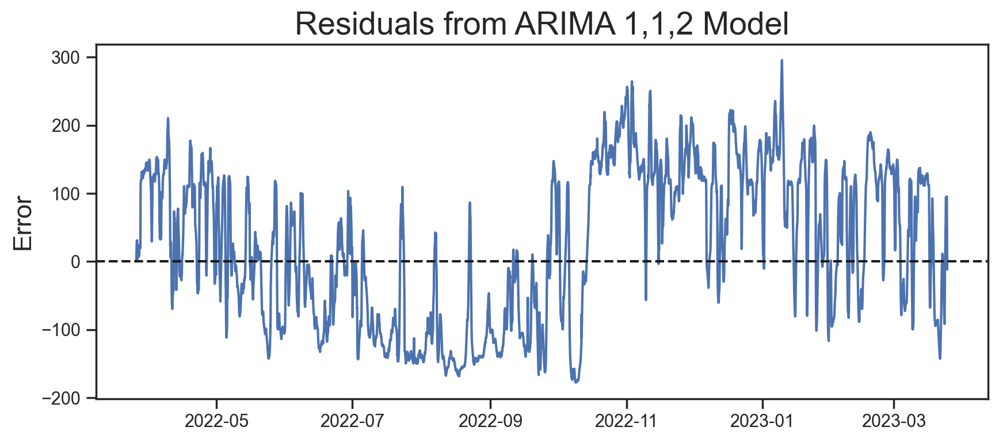

In [164]:
plt.figure(figsize=(10,4))
plt.plot(residuals)
plt.axhline(0, linestyle='--', color='k')
plt.title('Residuals from ARIMA 1,1,2 Model', fontsize=20)
plt.ylabel('Error', fontsize=16)

In [165]:
test_data

Datetime
2022-03-26 01:00:00    200.0
2022-03-26 02:00:00    206.0
2022-03-26 03:00:00    215.0
2022-03-26 04:00:00    221.0
2022-03-26 05:00:00    224.0
                       ...  
2023-03-24 20:00:00    276.0
2023-03-24 21:00:00    250.0
2023-03-24 22:00:00    219.0
2023-03-24 23:00:00    197.0
2023-03-25 00:00:00    180.0
Name: AQI, Length: 8736, dtype: float64

In [166]:
predictions

Datetime
2022-03-26 01:00:00    197.778090
2022-03-26 02:00:00    196.694641
2022-03-26 03:00:00    195.799898
2022-03-26 04:00:00    195.060995
2022-03-26 05:00:00    194.450788
                          ...    
2023-03-24 20:00:00    191.557528
2023-03-24 21:00:00    191.557528
2023-03-24 22:00:00    191.557528
2023-03-24 23:00:00    191.557528
2023-03-25 00:00:00    191.557528
Name: predicted_mean, Length: 8736, dtype: float64

<Figure size 1000x400 with 0 Axes>

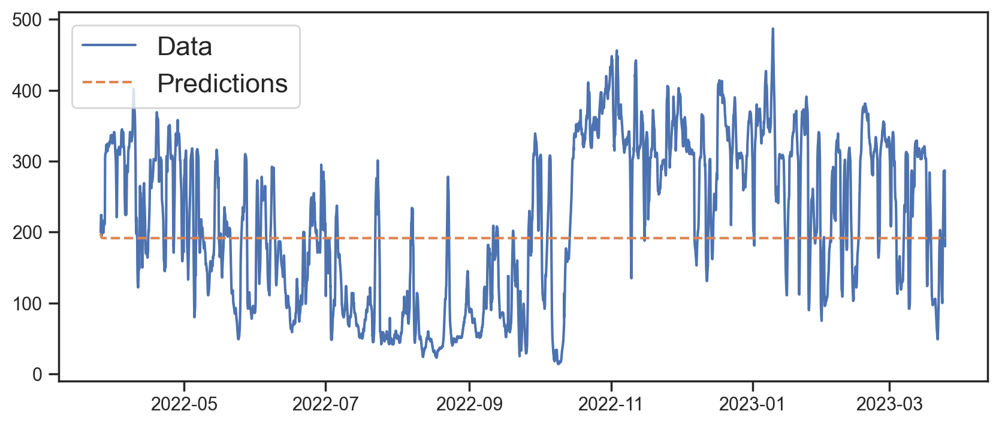

In [167]:
plt.figure(figsize=(10,4))

plt.plot(test_data)
plt.plot(predictions,'--')

plt.legend(('Data', 'Predictions'), fontsize=16)

# plt.title('Catfish Sales in 1000s of Pounds', fontsize=20)
# plt.ylabel('Production', fontsize=16)
# for year in range(start_date.year,end_date.year):
#     plt.axvline(pd.to_datetime(str(year)+'-01-01'), color='k', linestyle='--', alpha=0.2)

In [178]:
def fit_model(df, p, d, q):
    model_fit = ARIMA(train_data, order=(p, d, q))
    model_fit = model_fit.fit()
    print("Model summary ",model_fit.summary())

    start = len(train_data)
    end = start + len(test_data) - 1
    predictions = model_fit.predict(start=start, end = end) 
    predictions = pd.Series(predictions, index=test_data.index)
    residuals = test_data - predictions
    print(pd.DataFrme({"Predictions": predictions,"Actual": test_data, "residuals": residuals}))
    
    plt.figure(figsize=(14, 7))
    plt.plot(test_data)
    plt.plot(predictions, '--')
    plt.legend(('Data', 'Predictions'), fontsize=16)
    plt.title("ARIMA " + str(p) + str(d) + str(q))

In [173]:
train_data
test_data

Datetime
2020-03-05 00:00:00    103.0
2020-03-05 01:00:00    103.0
2020-03-05 02:00:00    103.0
2020-03-05 03:00:00    103.0
2020-03-05 04:00:00    103.0
                       ...  
2022-03-25 20:00:00    214.0
2022-03-25 21:00:00    207.0
2022-03-25 22:00:00    202.0
2022-03-25 23:00:00    200.0
2022-03-26 00:00:00    199.0
Name: AQI, Length: 18025, dtype: float64

Datetime
2022-03-26 01:00:00    200.0
2022-03-26 02:00:00    206.0
2022-03-26 03:00:00    215.0
2022-03-26 04:00:00    221.0
2022-03-26 05:00:00    224.0
                       ...  
2023-03-24 20:00:00    276.0
2023-03-24 21:00:00    250.0
2023-03-24 22:00:00    219.0
2023-03-24 23:00:00    197.0
2023-03-25 00:00:00    180.0
Name: AQI, Length: 8736, dtype: float64

In [177]:
start
end 

18025

26760

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


Model summary                                 SARIMAX Results                                
Dep. Variable:                    AQI   No. Observations:                18025
Model:                 ARIMA(2, 0, 0)   Log Likelihood              -50215.229
Date:                Thu, 16 Nov 2023   AIC                         100438.457
Time:                        21:14:13   BIC                         100469.655
Sample:                    03-05-2020   HQIC                        100448.716
                         - 03-26-2022                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        199.2690     19.510     10.214      0.000     161.030     237.508
ar.L1          1.6894      0.001   1568.410      0.000       1.687       1.692
ar.L2         -0.6909      0.001   -6

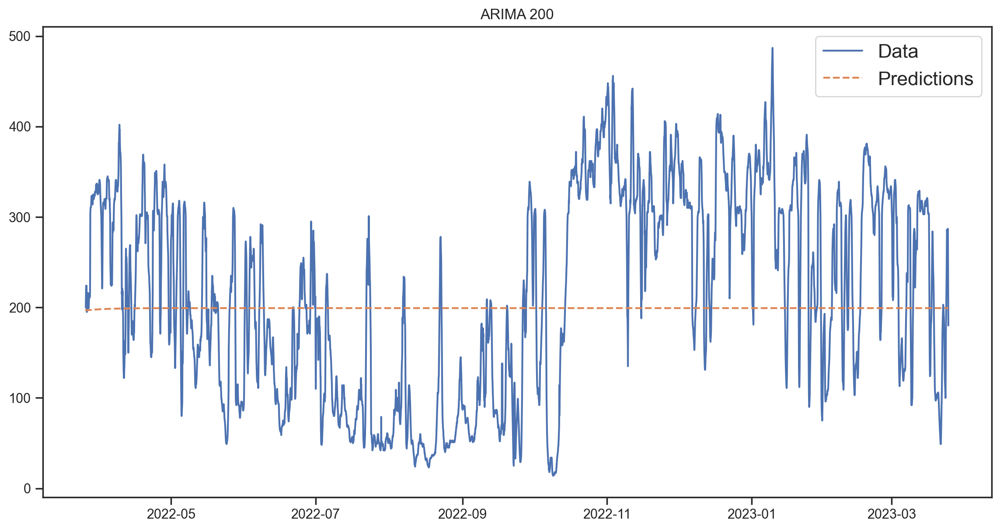

In [180]:
fit_model(df_sector_51, 2, 0, 0)

In [214]:
my_order = (1,0,2)
my_seasonal_order = (0, 0, 0, 0)
rolling_predictions = test_data.copy()
for train_end in test_data.index[:5]:
    train_data = train_data[:train_end-timedelta(hours=1)]
    print("train_end-timedelta(hours=1)", train_end-timedelta(hours=1))
    model = SARIMAX(train_data, order=my_order, seasonal_order=my_seasonal_order)
    model_fit = model.fit()

    pred = model_fit.forecast()
    print("pred",pred)
    rolling_predictions[train_end] = pred

train_end-timedelta(hours=1) 2022-03-26 00:00:00


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.86921D+00    |proj g|=  1.35832D-01


 This problem is unconstrained.



At iterate    5    f=  2.84723D+00    |proj g|=  6.73169D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4      8     10      1     0     0   1.330D-06   2.847D+00
  F =   2.8472034894955147     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
pred 2022-03-26 01:00:00    198.634987
Freq: H, dtype: float64
train_end-timedelta(hours=1) 2022-03-26 01:00:00


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.86921D+00    |proj g|=  1.35832D-01


 This problem is unconstrained.



At iterate    5    f=  2.84723D+00    |proj g|=  6.73169D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4      8     10      1     0     0   1.330D-06   2.847D+00
  F =   2.8472034894955147     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
pred 2022-03-26 01:00:00    198.634987
Freq: H, dtype: float64
train_end-timedelta(hours=1) 2022-03-26 02:00:00
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.86921D+00    |proj g|=  1.35832D-01


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  2.84723D+00    |proj g|=  6.73169D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4      8     10      1     0     0   1.330D-06   2.847D+00
  F =   2.8472034894955147     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
pred 2022-03-26 01:00:00    198.634987
Freq: H, dtype: float64
train_end-timedelta(hours=1) 2022-03-26 03:00:00


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            4     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.86921D+00    |proj g|=  1.35832D-01

At iterate    5    f=  2.84723D+00    |proj g|=  6.73169D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4      8     10      1     0     0   1.330D-06   2.847D+00
  F =   2.8472034894955147     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
pred 2022-03-26 01:00:00    198.634987
Freq: H, dtype: float64
train_end-timedelta(hours=1) 2022-03-26 04:00:00
RUNNING THE L-BFGS-B

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  self._init_dates(dates, freq)
 This problem is unconstrained.



At iterate    5    f=  2.84723D+00    |proj g|=  6.73169D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    4      8     10      1     0     0   1.330D-06   2.847D+00
  F =   2.8472034894955147     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
pred 2022-03-26 01:00:00    198.634987
Freq: H, dtype: float64


In [215]:
test_data[:10]
rolling_predictions[:10]

Datetime
2022-03-26 01:00:00    200.0
2022-03-26 02:00:00    206.0
2022-03-26 03:00:00    215.0
2022-03-26 04:00:00    221.0
2022-03-26 05:00:00    224.0
2022-03-26 06:00:00    224.0
2022-03-26 07:00:00    223.0
2022-03-26 08:00:00    224.0
2022-03-26 09:00:00    224.0
2022-03-26 10:00:00    215.0
Name: AQI, dtype: float64

Datetime
2022-03-26 01:00:00    198.634987
2022-03-26 02:00:00    198.634987
2022-03-26 03:00:00    198.634987
2022-03-26 04:00:00    198.634987
2022-03-26 05:00:00    198.634987
2022-03-26 06:00:00    224.000000
2022-03-26 07:00:00    223.000000
2022-03-26 08:00:00    224.000000
2022-03-26 09:00:00    224.000000
2022-03-26 10:00:00    215.000000
Name: AQI, dtype: float64

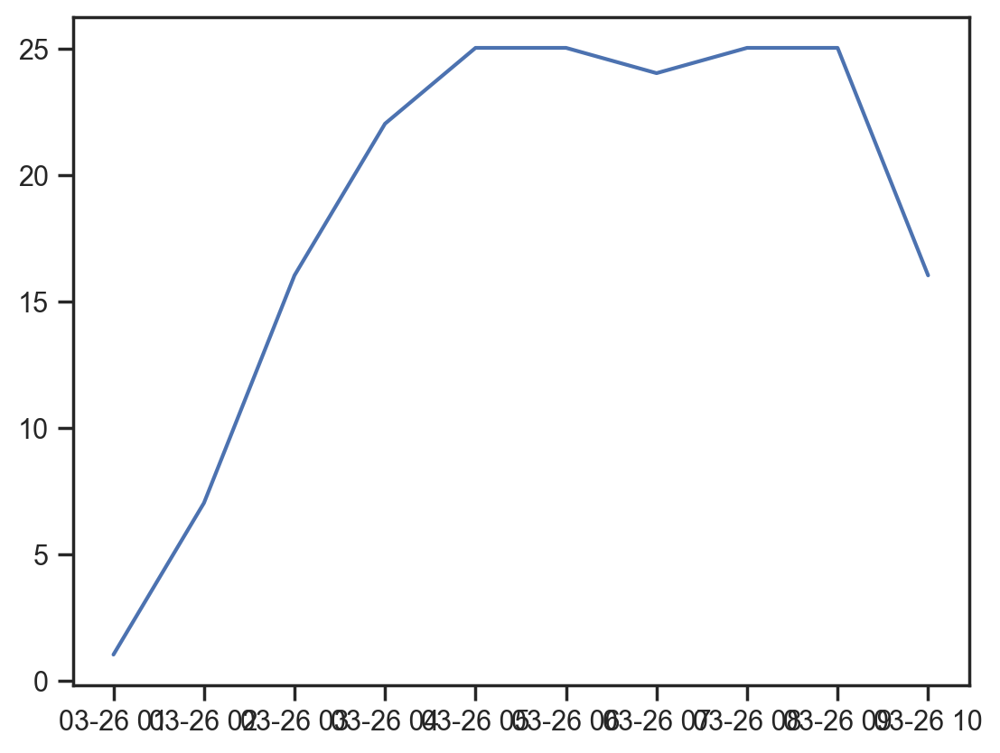

In [207]:
plt.plot(test_data[:10] - rolling_predictions[:10])

<Figure size 1400x700 with 0 Axes>

Text(0.5, 1.0, 'Rolling forecast ARIMA 1,0,0')

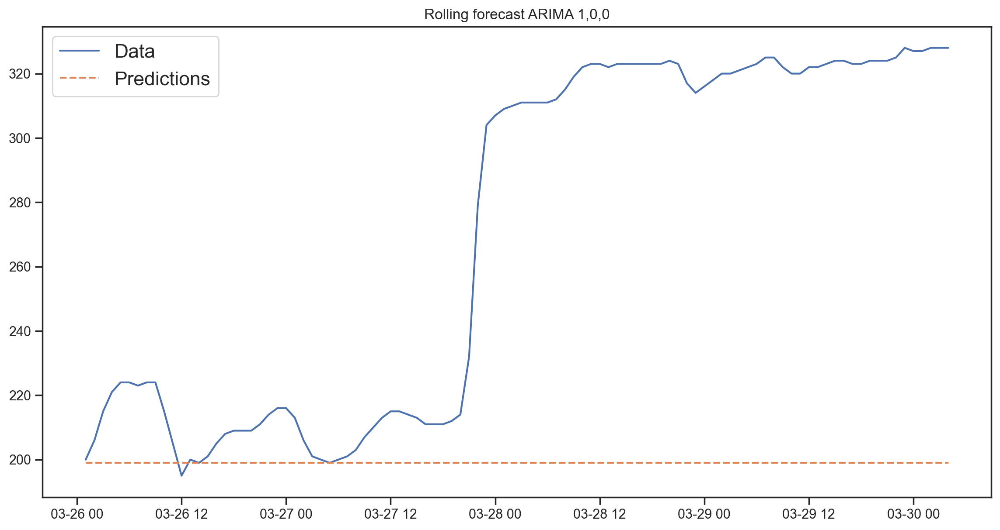

In [205]:
plt.figure(figsize=(14, 7))
plt.plot(test_data[:100])
plt.plot(rolling_predictions[:100], '--')
plt.legend(('Data', 'Predictions'), fontsize=16)
plt.title("Rolling forecast ARIMA 1,0,0")

In [206]:
rolling_predictions

Datetime
2022-03-26 01:00:00    198.950837
2022-03-26 02:00:00    198.950837
2022-03-26 03:00:00    198.950837
2022-03-26 04:00:00    198.950837
2022-03-26 05:00:00    198.950837
                          ...    
2023-03-24 20:00:00    276.000000
2023-03-24 21:00:00    250.000000
2023-03-24 22:00:00    219.000000
2023-03-24 23:00:00    197.000000
2023-03-25 00:00:00    180.000000
Name: AQI, Length: 8736, dtype: float64

In [47]:
df_sector_51 

,AQI,Lag_1,First_diff
Datetime,,,
2020-03-05 00:00:00,103.0,103.0,0.0
2020-03-05 01:00:00,103.0,103.0,0.0
2020-03-05 02:00:00,103.0,103.0,0.0
2020-03-05 03:00:00,103.0,103.0,0.0
2020-03-05 04:00:00,103.0,103.0,0.0
...,...,...,...
2023-03-26 12:00:00,213.0,205.0,10.0
2023-03-26 13:00:00,223.0,213.0,9.0
2023-03-26 14:00:00,232.0,223.0,9.0


<Figure size 1000x500 with 0 Axes>

<AxesSubplot: xlabel='AQI', ylabel='Lag_1'>

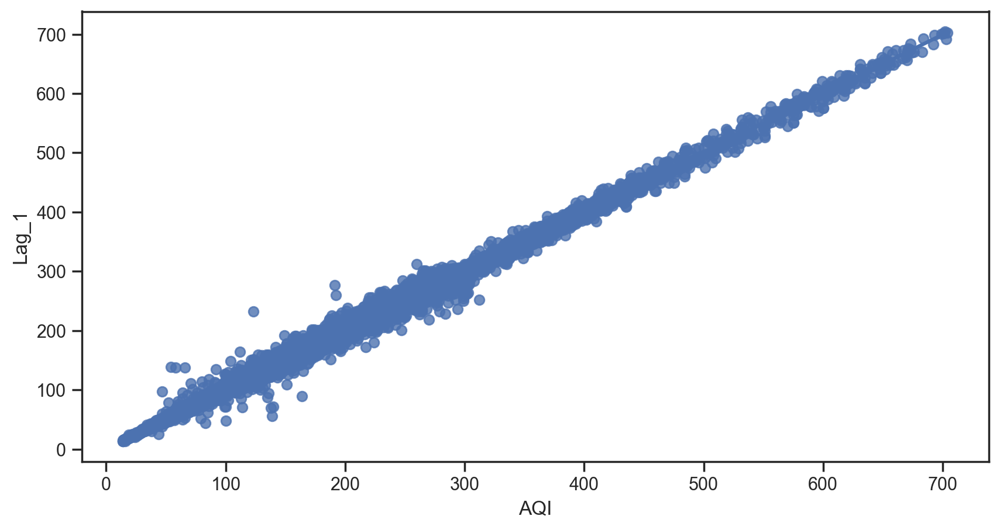

In [49]:
plt.figure(figsize=(10,5))
sns.regplot(data=df_sector_51, x = 'AQI', y='Lag_1')

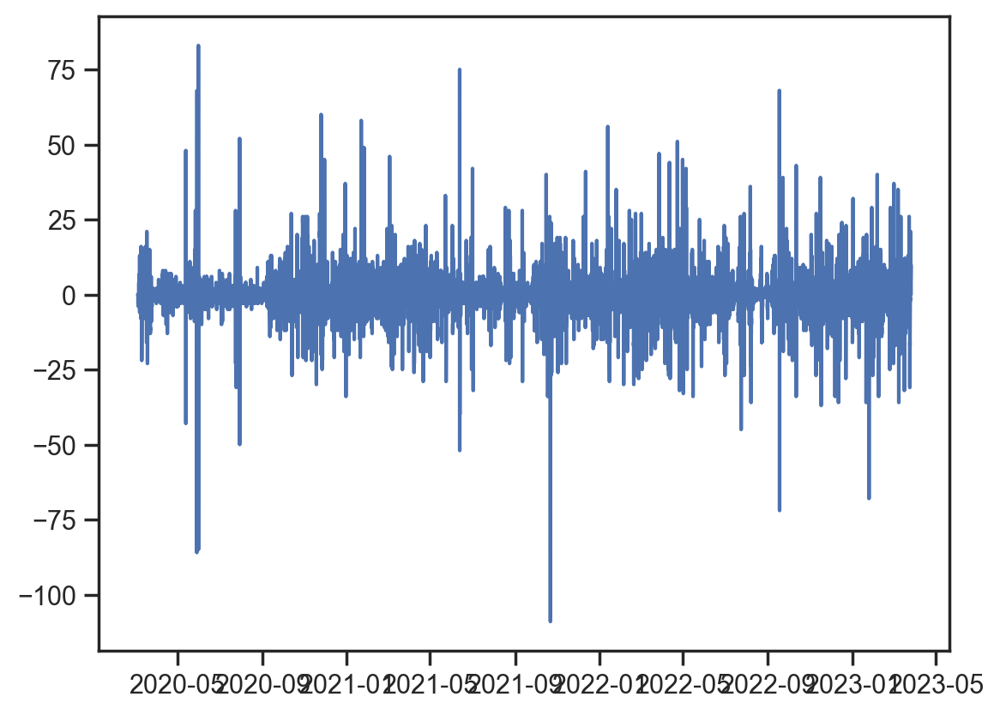

In [50]:
plt.plot(df_sector_51['First_diff'])